# Insurance Claim Fraud Detection

## Adeeb Naiyer

## Batch DS2402

## Project Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

Independent Variables

1.	months_as_customer: Number of months of patronage
2.	age: the length of time a customer has lived or a thing has existed
3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer
4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance
5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period
6.	policy_csl: is basically Combined Single Limit
7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss
8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year
9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies
10.	insured_zip: It is the zip code where the insurance was made
11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions
12.	insured_education_level: This refers to the Level of education of the customer
13.	insured_occupation: This refers Occupation of the customer
14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.
15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership
16.	capital-gains: This refers to profit accrued due to insurance premium
17.	capital-loss: This refers to the losses incurred due to insurance claims
18.	incident_date: This refers to the date which claims where made by customers
19.	incident_type: This refers to the type of claim/vehicle damage made by customer
20.	collision_type: This refers to the area of damage on the vehicle
21.	incident_severity: This refers to the extent/level of damage
22.	authorities_contacted: This refers to the government agencies that were contacted after damage
23.	incident_state: This refers to the state at which the accident happened
24.	incident_city: This refers to the city at which the accident happened
25.	1ncident_location: This refers to the location at which the accident happened
26.	incident_hour_of_the_day: The period of the day which accident took place
27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident
28.	property_damage: This refers to whether property was damaged or not
29.	bodily_injuries: This refers to injuries sustained
30.	witnesses: This refers to the number of witnesses involved
31.	police_report_available: This refers to whether the report on damage was documented or not
32.	total_claim_amount: This refers to the financial implications involved in claims
33.	injury_claim: This refers to physical injuries sustained
34.	property_claim: This refers to property damages during incident
35.	vehicle_claim: This refers to property damages during incident
36.	auto_make: This refers to the make of the vehicle
37.	auto_model: This refers to the model of the vehicle
38.	auto_year: This refers to the year which the vehicle was manufactured
39.	_c39:
40.	fraud_reported

Dataset Link-  

•	https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import zipfile
warnings.filterwarnings('ignore')

In [2]:
# Loading the dataset
url = "https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv"
df = pd.read_csv(url)

In [3]:
def show_percentage(ax, total):
    ''' Shows the representative percentage in each bar in a countplot.'''
    for p in ax.patches:
        percentage = f"{100 * p.get_height()/total:.1f} %"
        x = p.get_x() + p.get_width() / 2 - 0.02
        y = p.get_height()
        ax.annotate(percentage, (x, y), fontsize=10, ha='center', rotation=45)

# EDA

In [4]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [6]:
df.shape

(1000, 40)

Dataset contains 1000 rows and 40 colummns

In [7]:
df.columns.to_list()

['months_as_customer',
 'age',
 'policy_number',
 'policy_bind_date',
 'policy_state',
 'policy_csl',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'capital-gains',
 'capital-loss',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'incident_location',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'property_damage',
 'bodily_injuries',
 'witnesses',
 'police_report_available',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_make',
 'auto_model',
 'auto_year',
 'fraud_reported',
 '_c39']

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

It consists of 3 types of data types: int, float, object

## Missing values

In [9]:
# checking the null values
miss_val = df.isnull().sum().to_frame("Null values")

# % of the null values
miss_val["% of missing"] = round(miss_val['Null values'] / len(df) * 100,2)
miss_val = miss_val.sort_values(by='% of missing', ascending=False)

miss_val

,Null values,% of missing
_c39,1000,100.0
age,0,0.0
incident_state,0,0.0
incident_city,0,0.0
incident_location,0,0.0
incident_hour_of_the_day,0,0.0
number_of_vehicles_involved,0,0.0
property_damage,0,0.0
bodily_injuries,0,0.0
witnesses,0,0.0


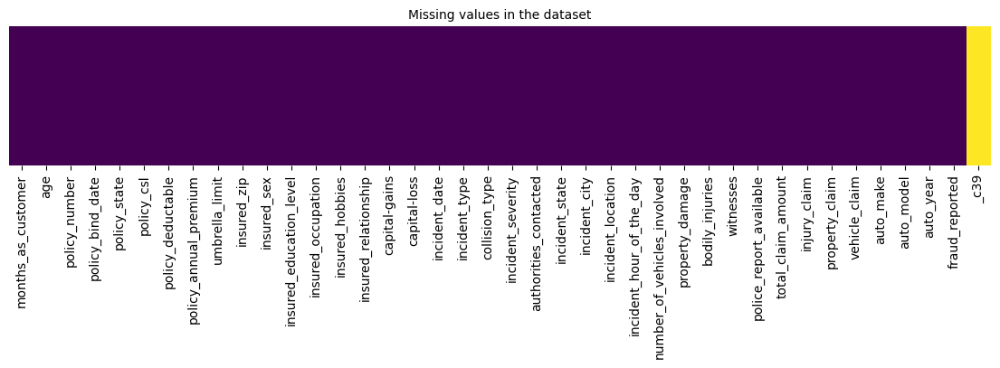

In [10]:
# Let's visualize it using heatmap for dataset
plt.figure(figsize=(14,2))
sns.heatmap(df.isnull(), yticklabels=False, cmap='viridis', cbar=False)
plt.title('Missing values in the dataset', fontsize=10);

Columns _c39 has no single value so we straight away drop it

In [11]:
# Dropping _c39

df.drop('_c39', axis=1, inplace= True)

Now there are no missing values in dataset

## Features Analysis

### Unique values

In [12]:
info_df = df.nunique().to_frame('No. of Unique values')
info_df['type'] = df.dtypes.values

info_df

,No. of Unique values,type
months_as_customer,391,int64
age,46,int64
policy_number,1000,int64
policy_bind_date,951,object
policy_state,3,object
policy_csl,3,object
policy_deductable,3,int64
policy_annual_premium,991,float64
umbrella_limit,11,int64
insured_zip,995,int64


### Obeservation:

The columns policy_number, incident_location, have same values as the number of the rows. So we can drop it as it does not help in the understanding any underlying patterns to prodict the output

The column insured_zip has almost same no of values as the no of rows, so we can go ahead and drop it

The columns policy_deductable(3), bodily_injuries(3), witnesses(4), number_of_vehicles_involved(4), umbrella_limit(11), auto_year(21), incident_hour_of_the_day(24), and age(46) columns, despite being numerical, should be analyzed as categorical during EDA.

#### Dropping the above said columns

In [13]:
# Dropping the columns
df.drop(['policy_number', 'incident_location', 'insured_zip'], axis=1, inplace=True)
display(df.sample(5))

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
991,257,44,12-07-2006,OH,100/300,1000,1280.88,0,MALE,MD,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N
610,303,46,14-01-2005,IN,100/300,1000,709.14,0,MALE,Masters,...,0,NO,54890,9980,4990,39920,Toyota,Corolla,2006,N
880,121,34,11-02-1991,IN,500/1000,500,1285.42,0,MALE,MD,...,1,NO,67300,6730,6730,53840,Dodge,RAM,2000,Y
89,41,25,15-01-1992,IN,100/300,1000,1226.83,0,FEMALE,College,...,0,?,45120,0,5640,39480,Accura,MDX,2011,Y
258,244,40,16-06-2006,IL,100/300,500,1342.80,0,FEMALE,MD,...,3,YES,5940,660,660,4620,Toyota,Camry,2014,N


In [14]:
df.shape

(1000, 36)

### Target unique values

In [15]:
# Checking the target variable
df['fraud_reported'].value_counts().to_frame()

,fraud_reported
N,753
Y,247


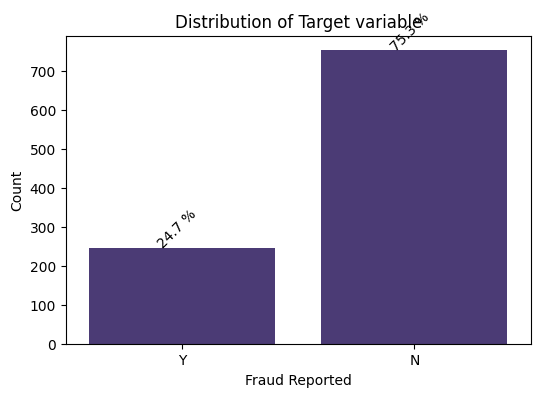

In [16]:
# Visualize the distribution of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(6, 4))
sns.set_palette('viridis')
ax = sns.countplot(data=df, x=col)
show_percentage(ax, len(df))
plt.title('Distribution of Target variable')
plt.xlabel('Fraud Reported')
plt.ylabel('Count')
plt.show()

The datatset in imbalanced

### Categorical columns unique values

In [17]:
# Separating Numerical and Categorical columns
cat_col =  df.select_dtypes(include='object').columns.tolist()
num_cat_col = ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']
num_col =  [col for col in df.select_dtypes(include=np.number).columns.tolist() if col not in num_cat_col]

#  Numerical and Categorical columns
print(f"Categorical Columns:\n {cat_col}\n")
print(f"Numerical Columns that represent a category:\n {num_cat_col}\n")
print(f"Numerical Columns:\n {num_col}\n")

Categorical Columns:
 ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

Numerical Columns that represent a category:
 ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']

Numerical Columns:
 ['months_as_customer', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']



In [18]:
# Checking the value counts of the categorical independent variables
for i, col in enumerate(cat_col[:-1]):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. policy_bind_date:
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
No. uniques values: 951

2. policy_state:
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
No. uniques values: 3

3. policy_csl:
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
No. uniques values: 3

4. insured_sex:
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64
No. uniques values: 2

5. insured_education_level:
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64
No. uniques values: 7

6. insured_occupation:
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-movi

#### Observation:

The policy_bind_datd and incident_date columns should be transformed to date.

The collision_type, property_damage, and police_report_available have a value as '?' which is equivalent to a null value, we need to handle it

#### Numerical but categorical column unique values

In [19]:
# Checking the value counts of the Numerical Columns that represent a category:
for i, col in enumerate(num_cat_col):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. policy_deductable:
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
No. uniques values: 3

2. bodily_injuries:
0    340
2    332
1    328
Name: bodily_injuries, dtype: int64
No. uniques values: 3

3. witnesses:
1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64
No. uniques values: 4

4. number_of_vehicles_involved:
1    581
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64
No. uniques values: 4

5. umbrella_limit:
 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64
No. uniques values: 11

6. auto_year:
1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype:

#### Numerical unique values

In [20]:
# Checking the value counts of the numerical independent variables
for i, col in enumerate(num_col):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. months_as_customer:
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
No. uniques values: 391

2. policy_annual_premium:
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: policy_annual_premium, Length: 991, dtype: int64
No. uniques values: 991

3. capital-gains:
0        508
46300      5
51500      4
68500      4
55600      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: capital-gains, Length: 338, dtype: int64
No. uniques values: 338

4. capital-loss:
 0        475
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700      1
-82100      1
Name: capital-loss, Length: 354, dtype: int64
No. uniques values: 354

5. total_claim_amount:
59400    5
2640     4
70400    4
4320     4
44200    4

## Statistics Summary

In [21]:
# Summary statistics of numerical columns
stats = df.describe()

stats

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


### Observations:

There are negative columns in umbrella limit and capital loss columns

There are no missing values

In [22]:
# Contrast the mean with the median
(stats.loc['mean',:] - stats.loc['50%',:]).sort_values(ascending=False)

umbrella_limit                 1.101000e+06
capital-gains                  2.512610e+04
injury_claim                   6.584200e+02
property_claim                 6.495700e+02
policy_deductable              1.360000e+02
months_as_customer             4.454000e+00
age                            9.480000e-01
number_of_vehicles_involved    8.390000e-01
witnesses                      4.870000e-01
auto_year                      1.030000e-01
bodily_injuries               -8.000000e-03
incident_hour_of_the_day      -3.560000e-01
policy_annual_premium         -7.938500e-01
capital-loss                  -3.543700e+03
vehicle_claim                 -4.171050e+03
total_claim_amount            -5.293060e+03
dtype: float64

### Observations:

The mean value is larger than the median in columns umbrella_limit, capital-gains, injury_claim, property_claim, policy_deductable, months_as_customer, age, number_of_vehicles_involved, witnesses, and auto_year which means the data could be skewed to the right in these columns.

In [23]:
# Contrast the maximum value in each colum with 2 times the std plus the mean 
(stats.loc['max',:] - (stats.loc['mean',:] + 2 * stats.loc['std',:] ) ).sort_values(ascending=False)

umbrella_limit                 4.304187e+06
capital-gains                  1.962952e+04
total_claim_amount             9.354994e+03
property_claim                 6.620978e+03
injury_claim                   4.254676e+03
vehicle_claim                  3.858544e+03
policy_annual_premium          3.028491e+02
months_as_customer             4.481965e+01
age                            6.771427e+00
number_of_vehicles_involved    1.232393e-01
bodily_injuries               -6.322544e-01
witnesses                     -7.096705e-01
auto_year                     -2.134722e+00
incident_hour_of_the_day      -2.546746e+00
policy_deductable             -3.597293e+02
capital-loss                  -2.941449e+04
dtype: float64

### Observations:

The dataset could present outliers in the columns umbrella_limit, capital-gains, total_claim_amount, property_claim, injury_claim, vehicle_claim, policy_annual_premium, months_as_customer, and age

Feature scaling is required

In [24]:
# non numeric columns
df.describe(exclude=[np.number])

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,4,4,5,7,7,3,3,14,39,2
top,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,?,?,Saab,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,292,354,292,262,157,360,343,80,43,753


### Duplicates

In [25]:
# Searching for duplicated values
df[df.duplicated()].shape

(0, 36)

## Data visualisation

### Univariate Analysis

#### Target 

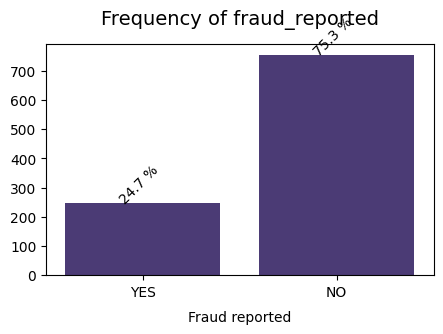

In [26]:

# Set the custom palette
sns.set_palette('viridis')

# Visualize the frequency of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(5, 3))
ax = sns.countplot(x=col, data=df)
show_percentage(ax, len(df)) 

plt.xlabel('Fraud reported', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks((0, 1), ['YES', 'NO'], size=10)
plt.title(f"Frequency of {col}", size=14, y=1.05);

### Categorical columns

In [27]:
# Remove and transform the date columns
date_col = ['policy_bind_date', 'incident_date']

for col in date_col:
    cat_col.remove(col)
    df[col] = pd.to_datetime(df[col])

In [28]:
# List of categorical columns in the dataset
for i,col in enumerate(cat_col[:-1]):
    print(f"{i+1}. {col}")

1. policy_state
2. policy_csl
3. insured_sex
4. insured_education_level
5. insured_occupation
6. insured_hobbies
7. insured_relationship
8. incident_type
9. collision_type
10. incident_severity
11. authorities_contacted
12. incident_state
13. incident_city
14. property_damage
15. police_report_available
16. auto_make
17. auto_model


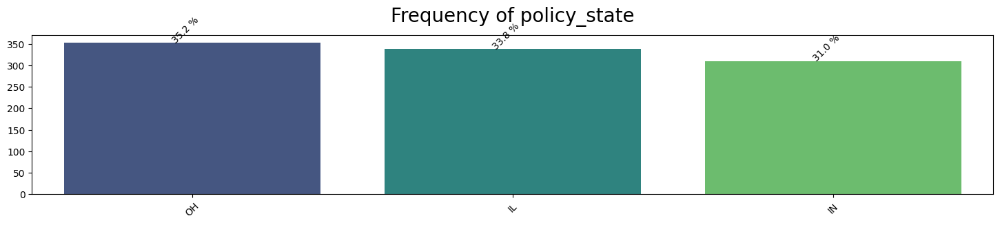

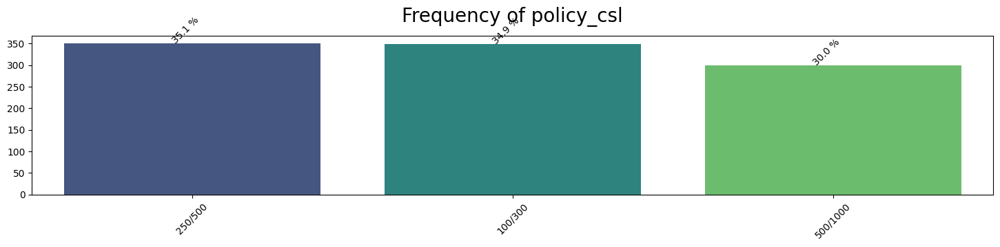

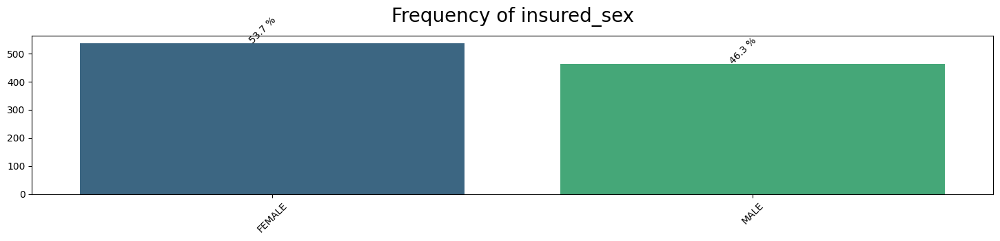

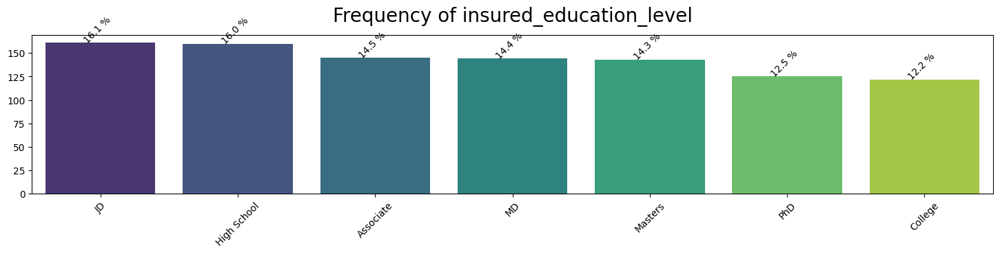

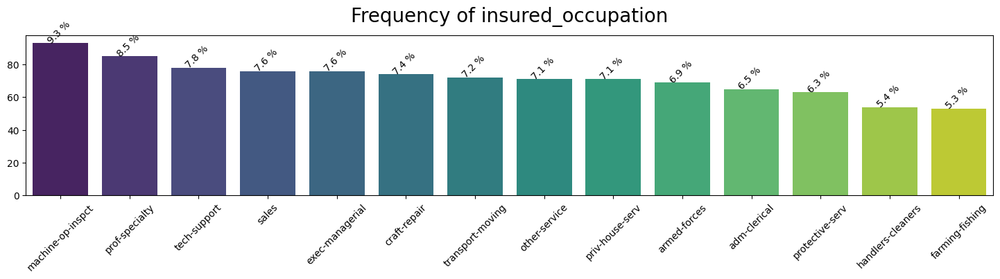

...

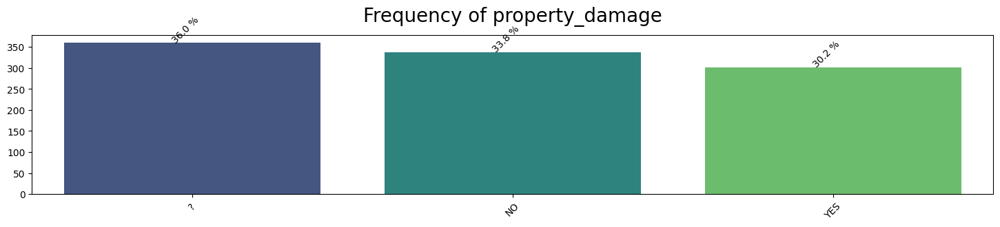

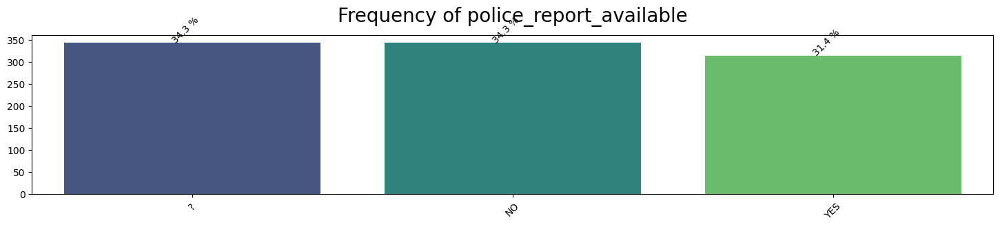

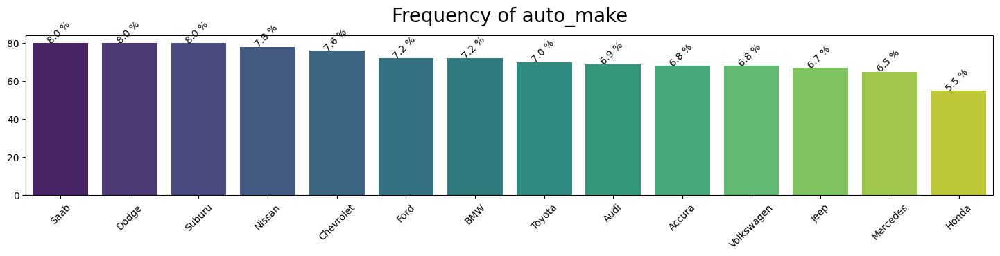

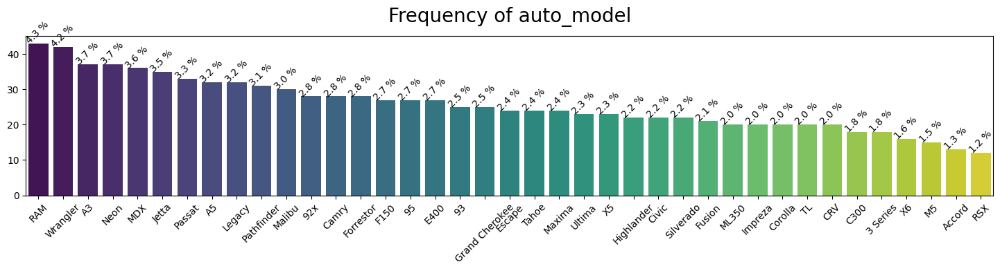

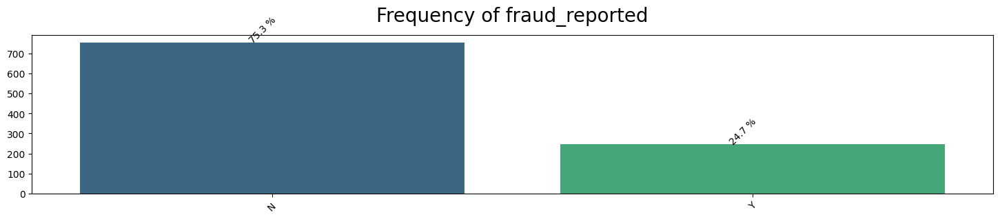

In [29]:
for i in cat_col:
        
# Visualize the frequency of policy_state(1)
    plt.figure(figsize=(18, 3))
    df_sorted = df[i].value_counts().to_frame()
    ax = sns.barplot(x=df_sorted.index, y=df_sorted[i], palette='viridis')
    show_percentage(ax, len(df)) 

    plt.xticks(rotation=45)

    plt.xlabel('', size=10, labelpad=8)
    plt.ylabel('', size=10, labelpad=8)
    plt.title(f"Frequency of {i}", size=20, y=1.05)

    df[i].value_counts(normalize=True).to_frame()

#### Visualisation of Numerical columns analyzed as categories

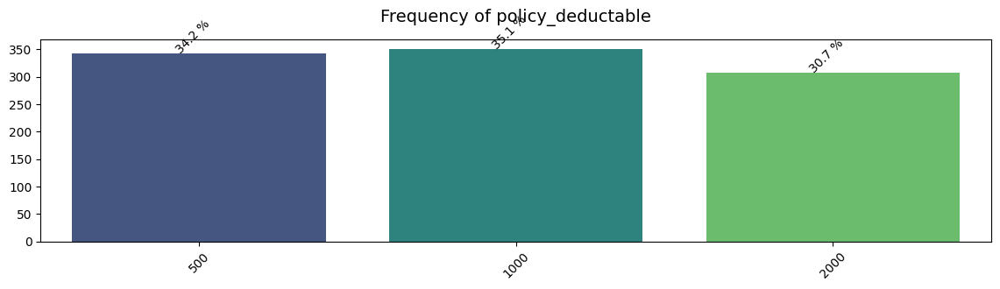

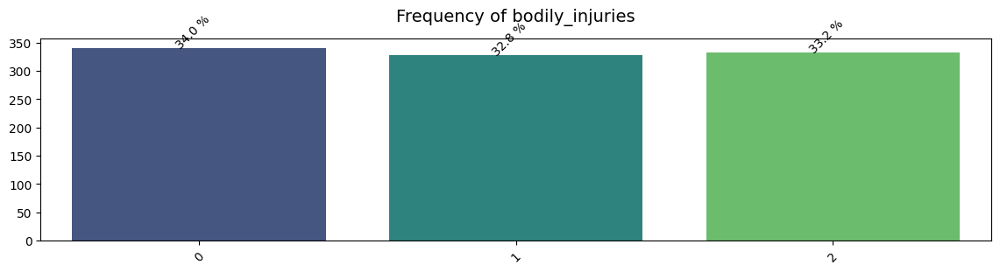

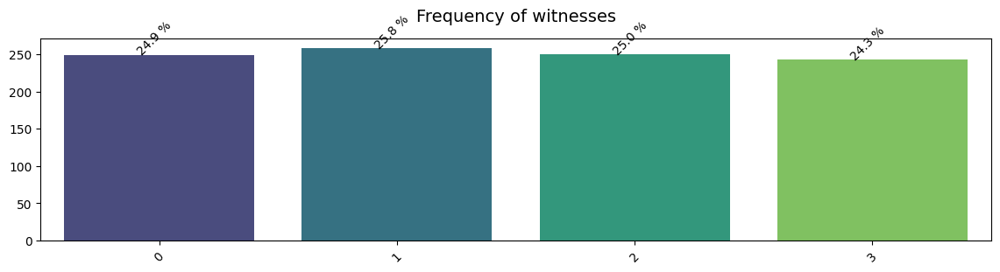

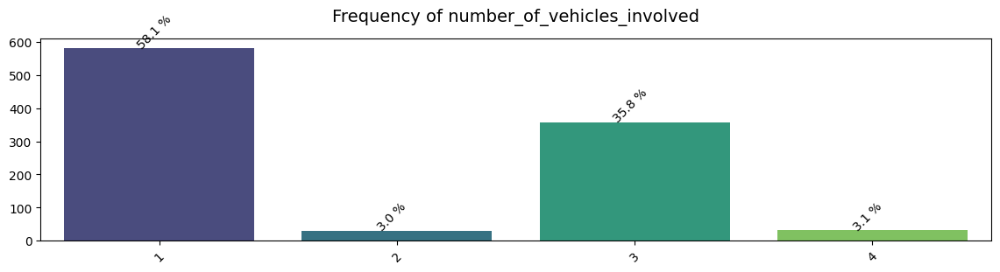

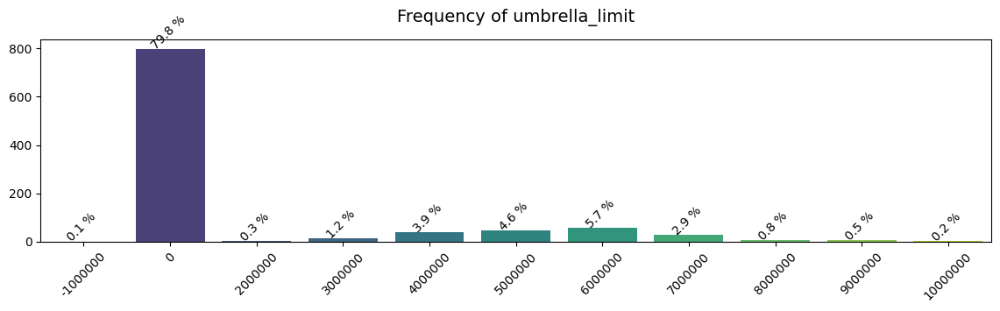

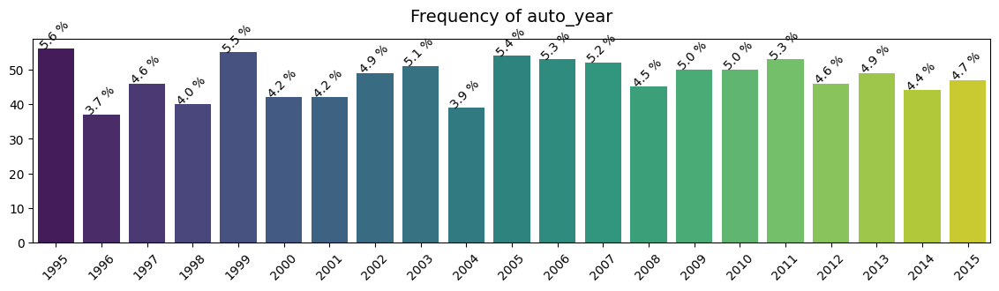

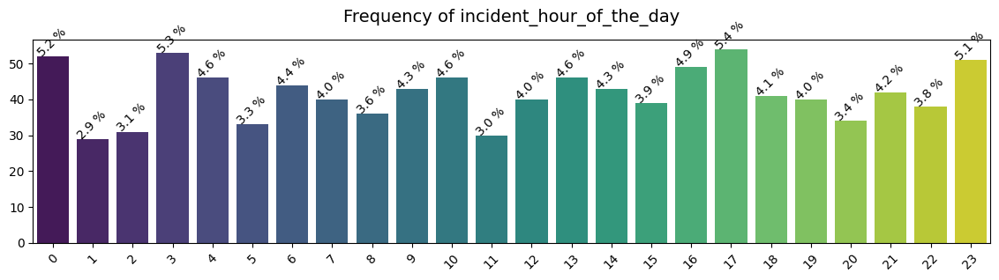

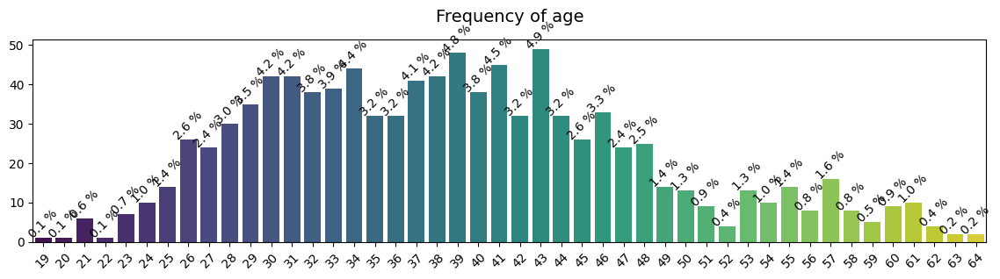

In [30]:
for i in num_cat_col:
        
# Visualize the frequency of policy_deductable(1)
    col = 'policy_deductable'
    plt.figure(figsize=(14, 3))
    df_sorted = df[i].value_counts().to_frame()
    ax = sns.barplot(x=df_sorted.index, y=df_sorted[i], palette='viridis')
    show_percentage(ax, len(df)) 

    plt.xticks(rotation=45)

    plt.xlabel('', size=10, labelpad=8)
    plt.ylabel('', size=10, labelpad=8)
    plt.title(f"Frequency of {i}", size=14, y=1.05)

    values_column = df[i].value_counts( dropna=False).to_frame('No.')
    values_column['%'] = round(df[i].value_counts(normalize=True, dropna=False) * 100, 2)
    values_column.T

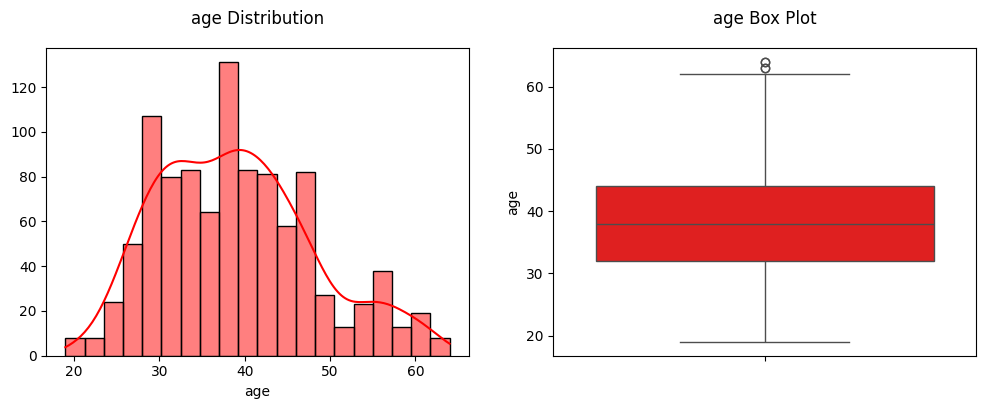

Skewness of age : 0.47898804709224163


In [31]:
col = 'age'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='r')
sns.boxplot(df[col], ax=axes[1], color='r')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of Age
print(f"Skewness of {col} : {df[col].skew()}")

Age colummn distribution is normal and there are some outliers present

### Visualising Numerical columns

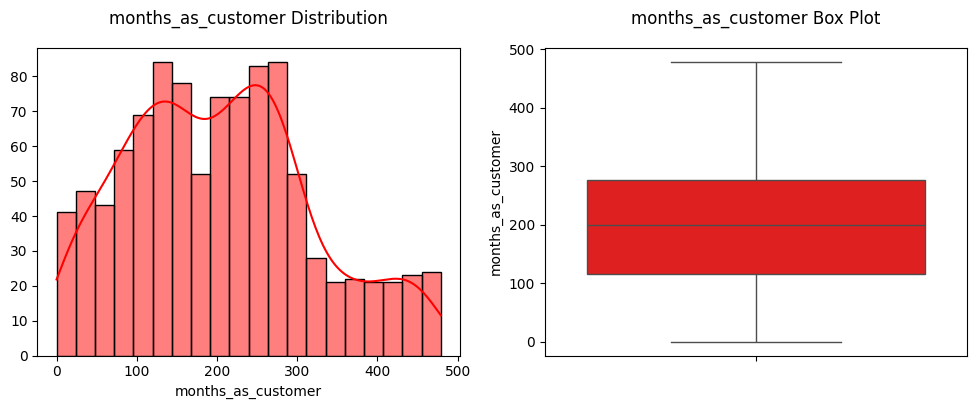

Skewness of months_as_customer : 0.3621768477780205


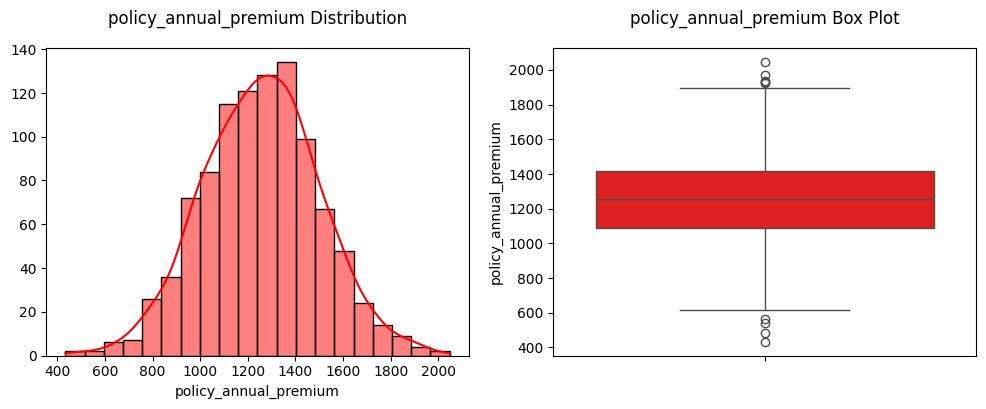

Skewness of policy_annual_premium : 0.004401994526610823


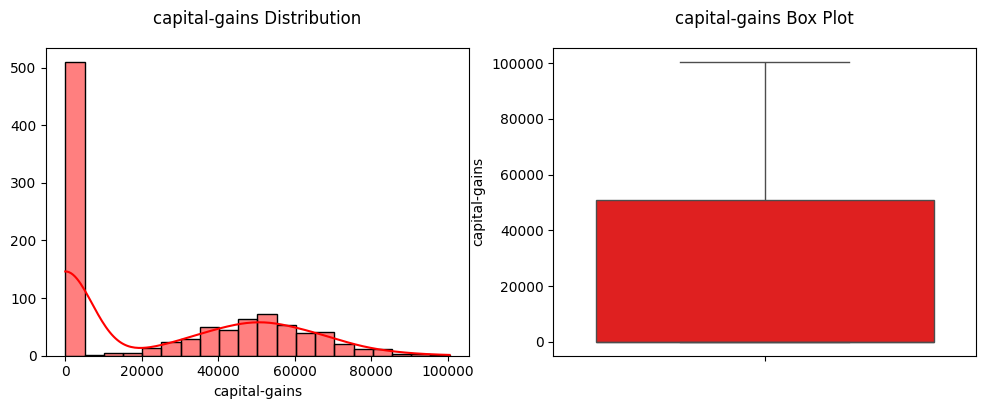

Skewness of capital-gains : 0.4788502295807907


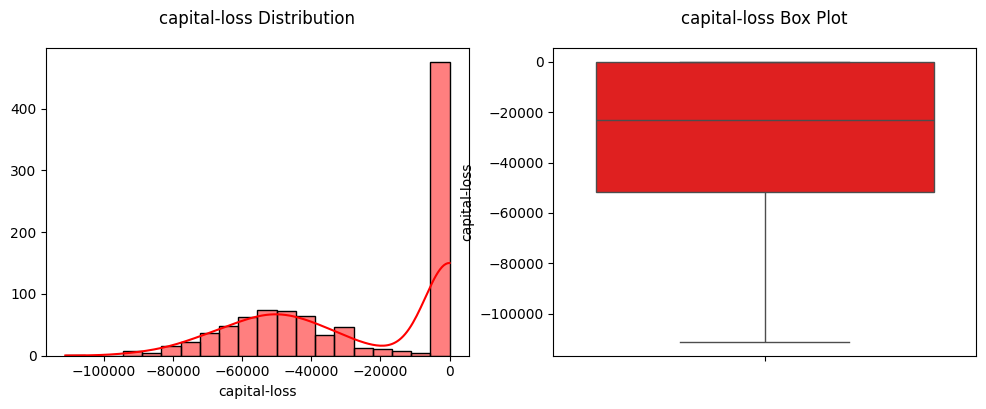

Skewness of capital-loss : -0.39147194299389343


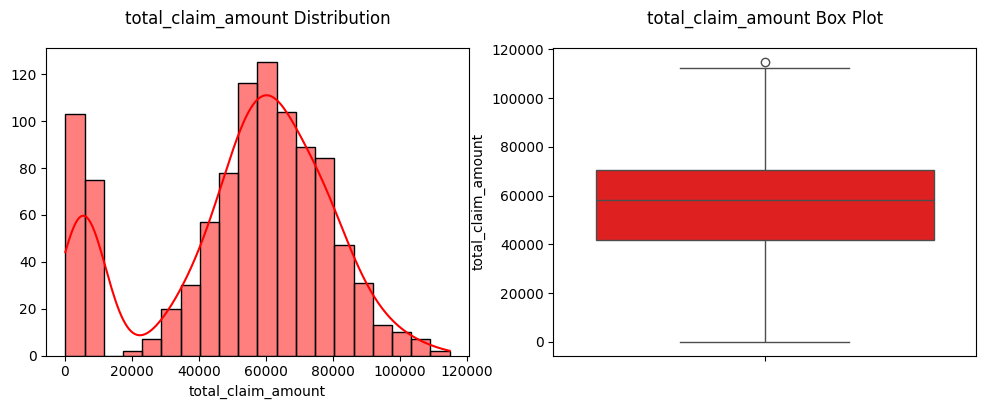

Skewness of total_claim_amount : -0.594581988510234


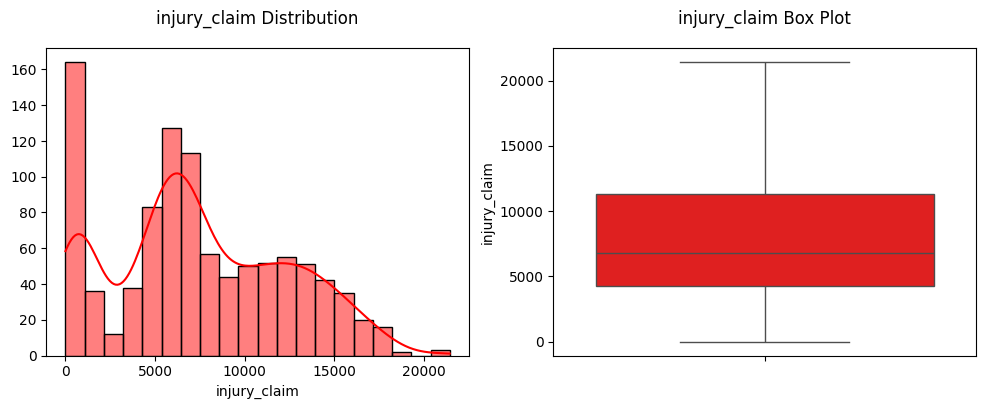

Skewness of injury_claim : 0.26481087847181833


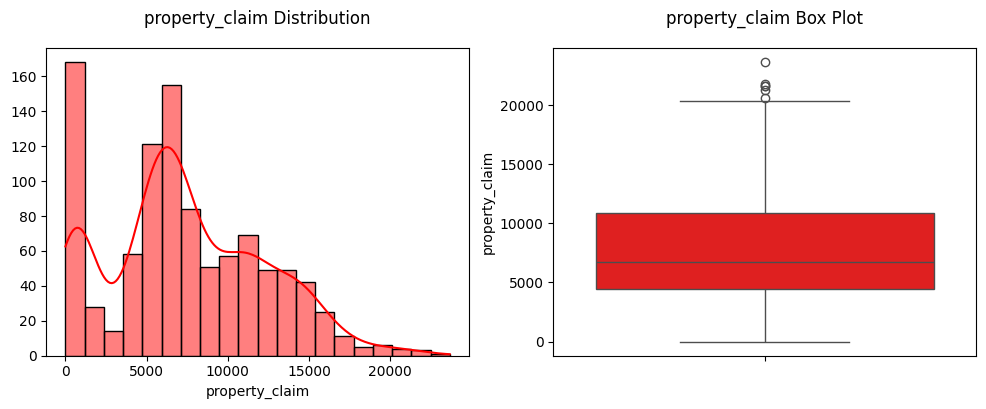

Skewness of property_claim : 0.3781687764308289


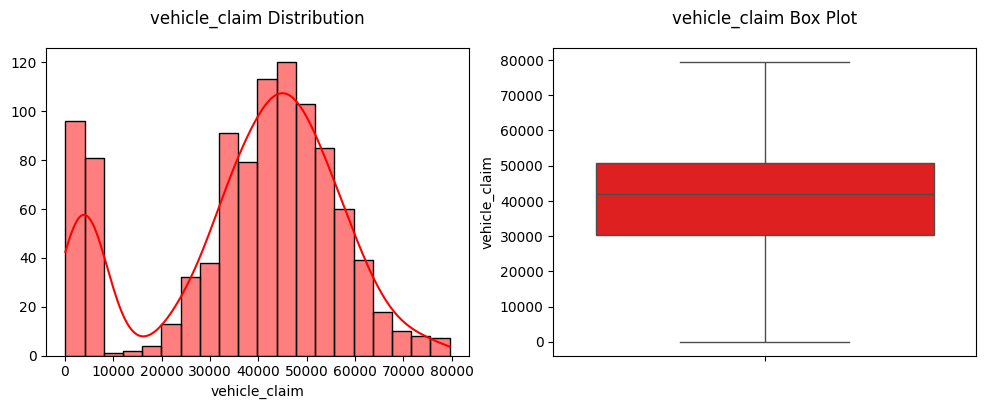

Skewness of vehicle_claim : -0.6210979312228687


In [32]:
for i in num_col:
        
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    sns.histplot(df[i], kde=True , bins=20, ax=axes[0], color='r')
    sns.boxplot(df[i], ax=axes[1], color='r')

    axes[0].set_title(f'{i} Distribution', size=12, y=1.05)
    axes[0].set_ylabel('', size=10, labelpad=8)

    axes[1].set_title(f'{i} Box Plot', size=12, y=1.05)

    plt.show()

# Show the skewness of months_as_customer
    print(f"Skewness of {i} : {df[i].skew()}")

#### Observation:

-The data is right skewed a bit in months_as_customer and no outliers

-policy annual premiun almost normal but outliers present

-capital gains is right skewed and no outliers present

-capital loss is left skewed and no outliers present in the data

-total_claim_amount is a bit right skewed and some outliers present in the data

-injury_claim is right skewed and no outliers in dtaa

-property_claims is right skewed and some outliers present in the data

-vehicle_claim is left skewed and no outliers in data



## Bivariate Analysis

#### Numerical column vs target

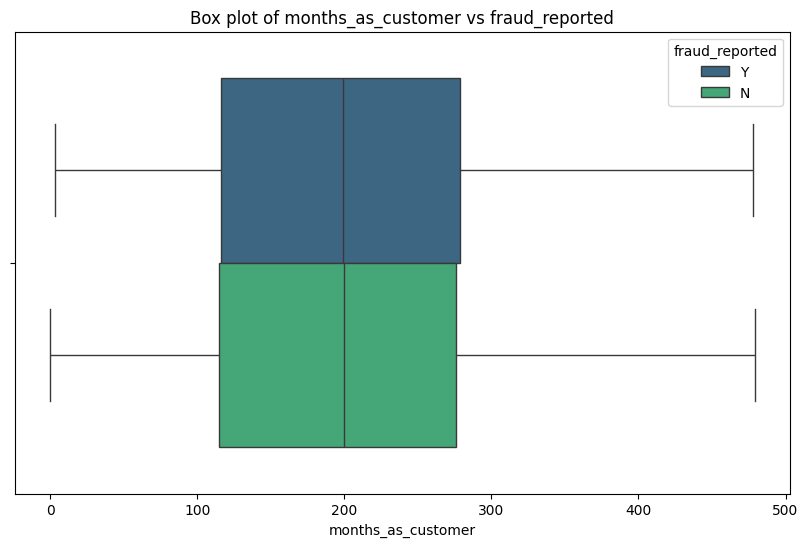

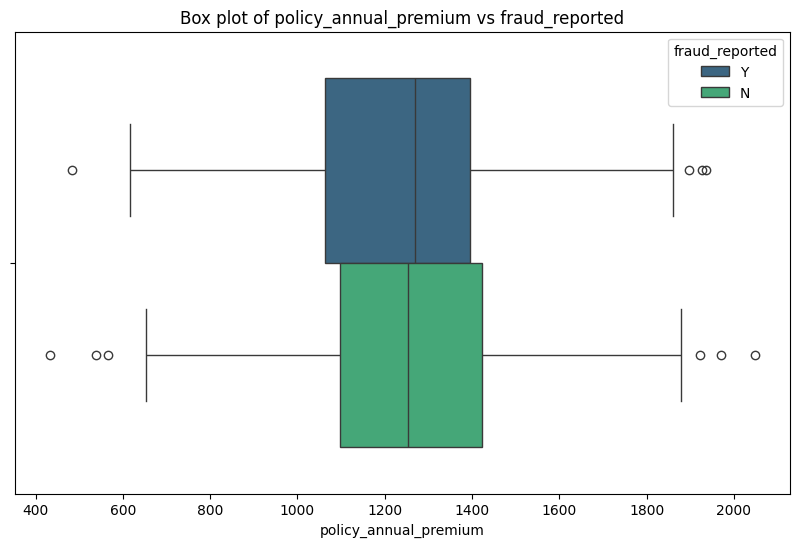

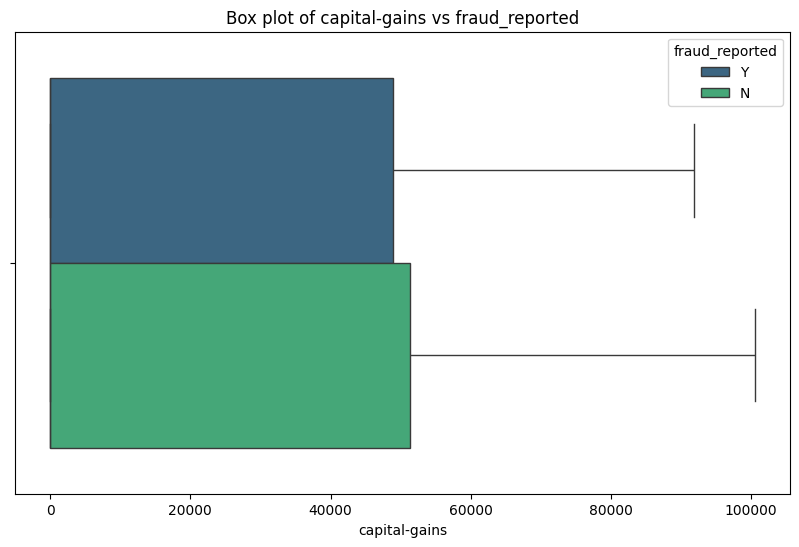

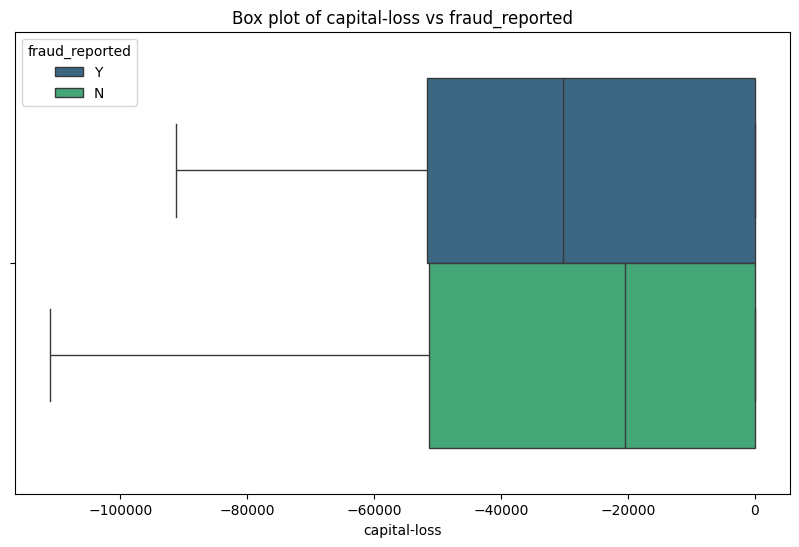

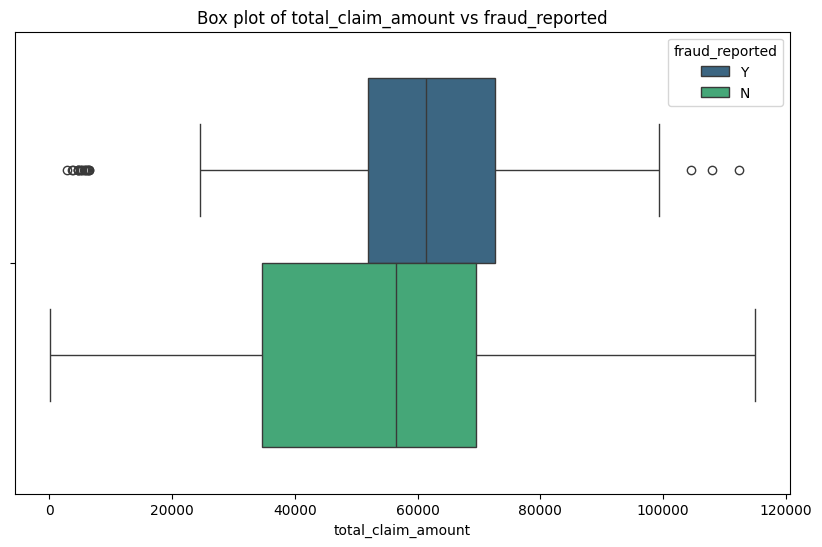

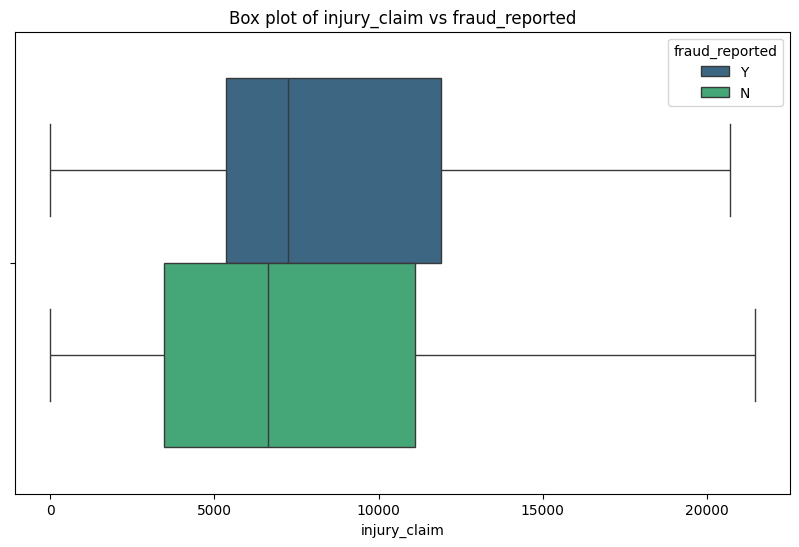

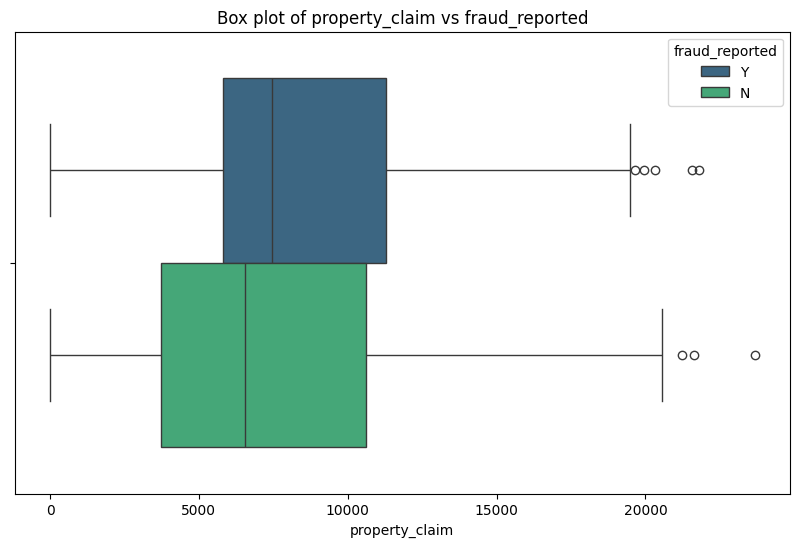

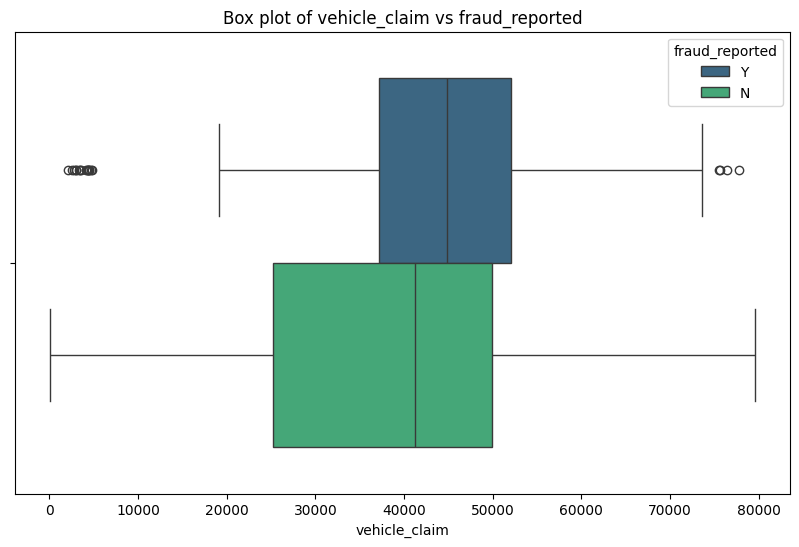

In [33]:
for i in num_col:
    plt.figure(figsize=(10,6) )

    sns.boxplot(x=i, hue='fraud_reported', data=df, palette='viridis')
    plt.title(f'Box plot of {i} vs fraud_reported')
    plt.show()

### Obseravtion:

Months as customer: has no effect on wheather the claim is fraud or not

policy_annual_premium:slight impact on the premium is fraud or not

capital_gains: similar impact wheater the claim is fraud or not

total claim amount: fraud claims tend to have large mean of 60000 while non fraudulent claims have around 50000

injury claim: the fraudulent claims have a slight higherr injuries compared to non fraudulent claims

property claim: fraudulent claims have higher values for property damage while non fraudulent have less values

vehivle claim: fraudulent values have higher claim when compared to non fraud

#### Categorical column vs target column

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


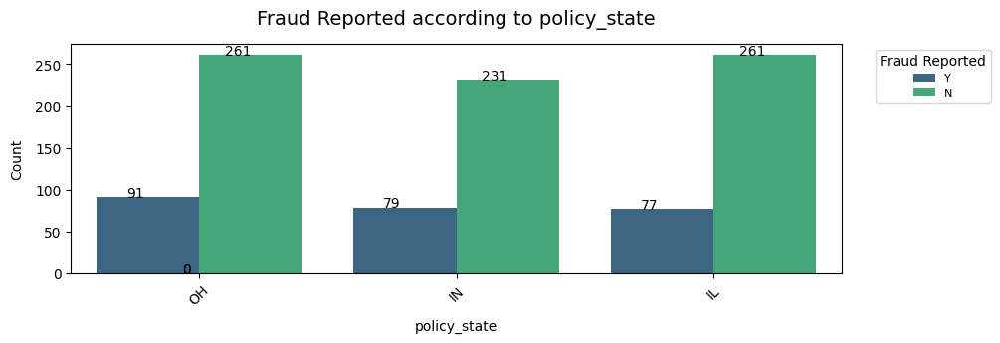

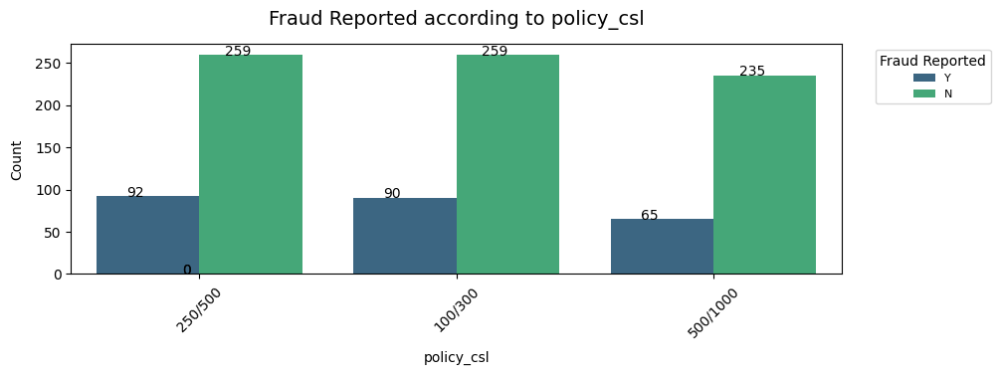

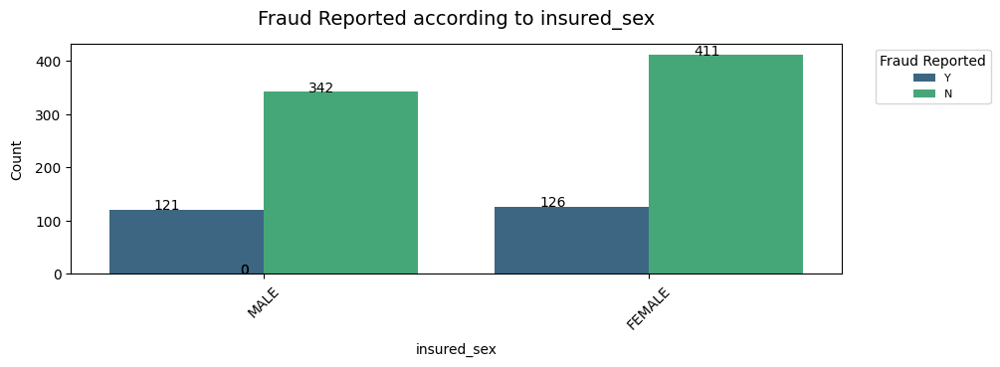

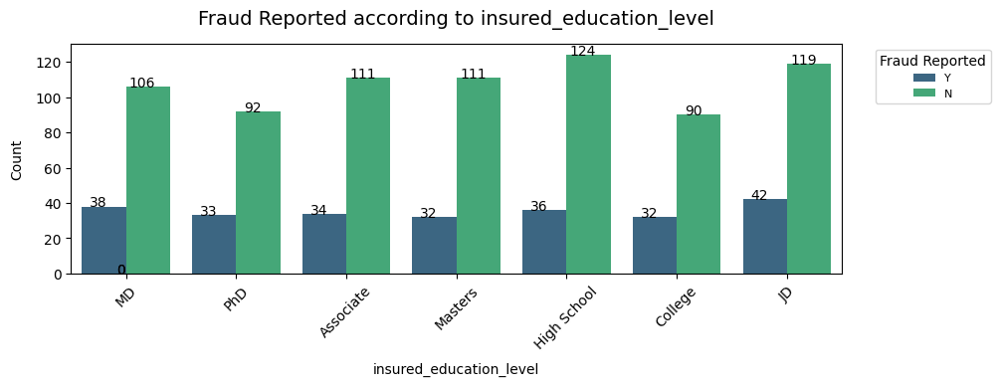

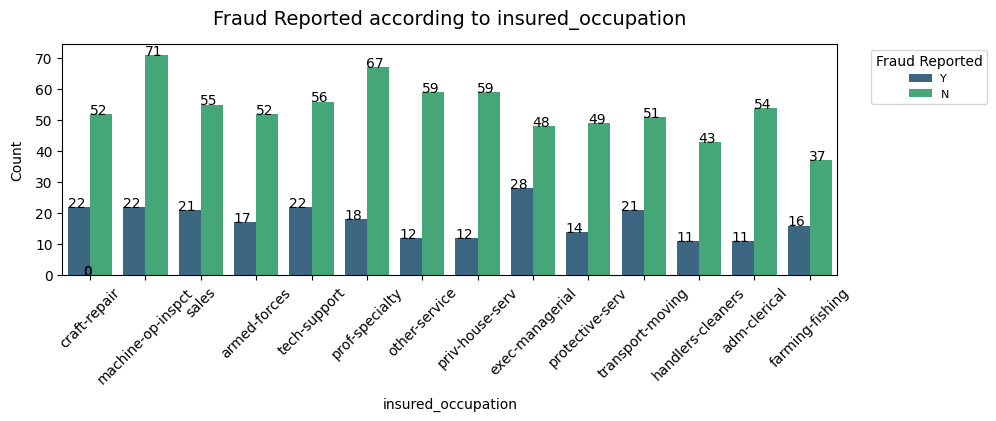

...

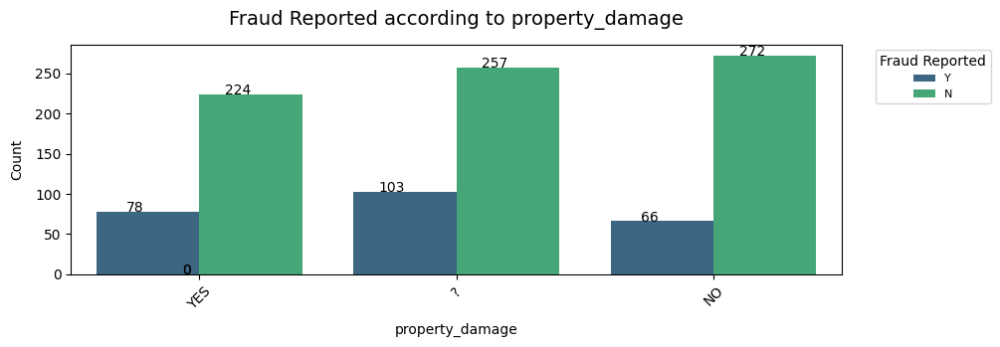

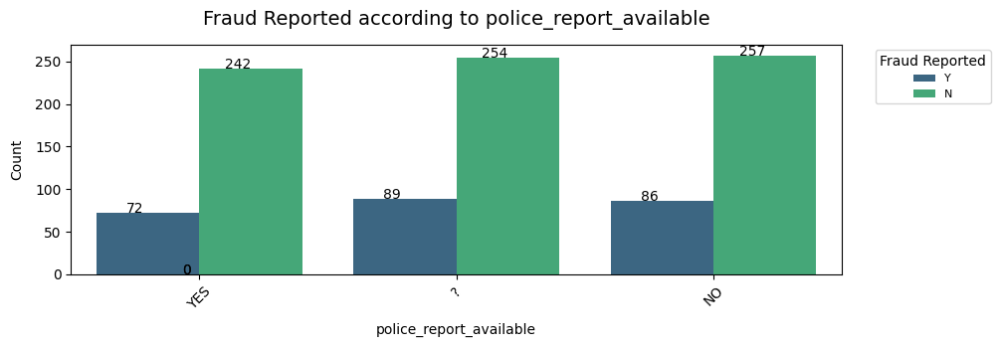

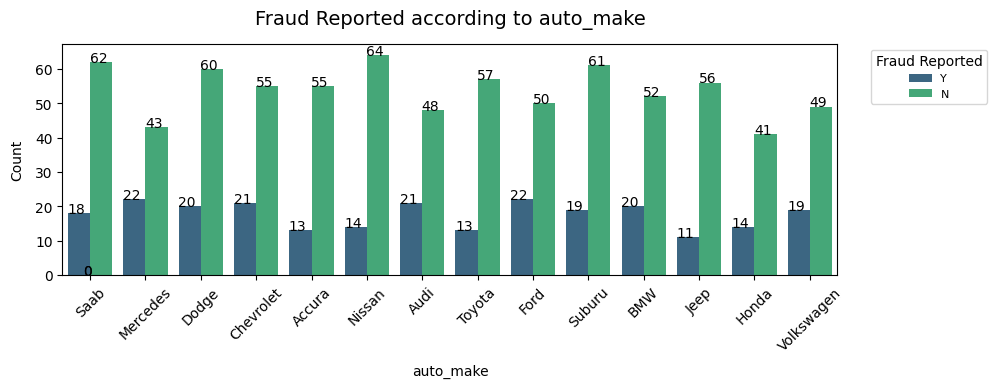

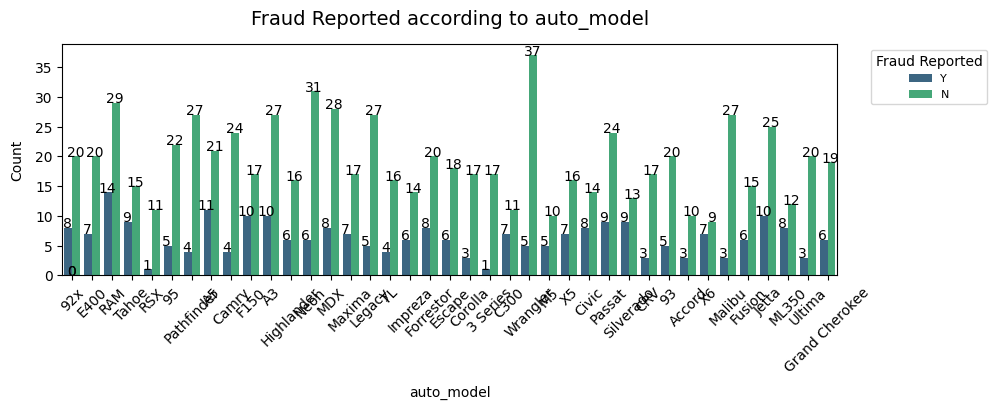

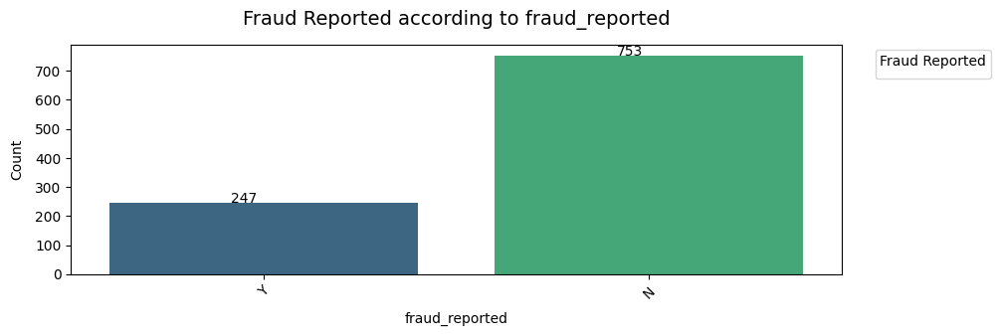

In [34]:
for i in cat_col:
    plt.figure(figsize=(10, 3))
    
    ax = sns.countplot(hue='fraud_reported', x=i, data=df, palette='viridis')
    
    plt.xlabel(i, size=10, labelpad=8)
    plt.ylabel('Count', size=10, labelpad=8)
    plt.xticks(rotation=45)
    plt.legend(prop={'size':8}, loc='upper right', bbox_to_anchor=(1.20, 1)).set_title("Fraud Reported")
    plt.title(f"Fraud Reported according to {i}", size=14, y=1.05)
    
    # Show counts on bars
    for p in ax.patches:
        count = int(p.get_height())
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(count, (x, y), size=10, ha='center')
    

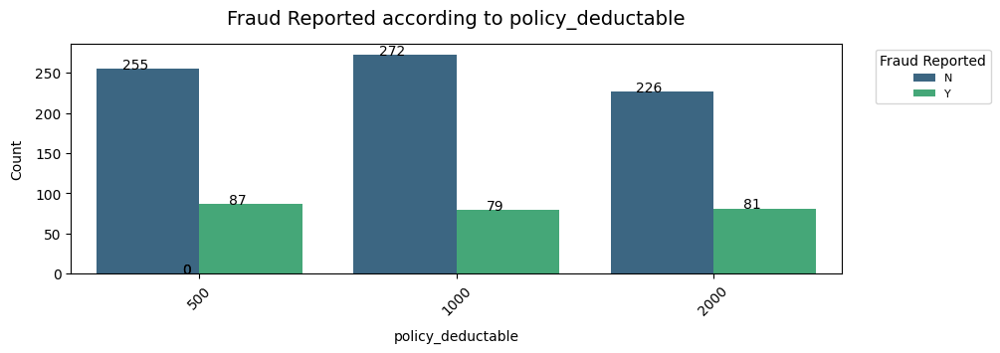

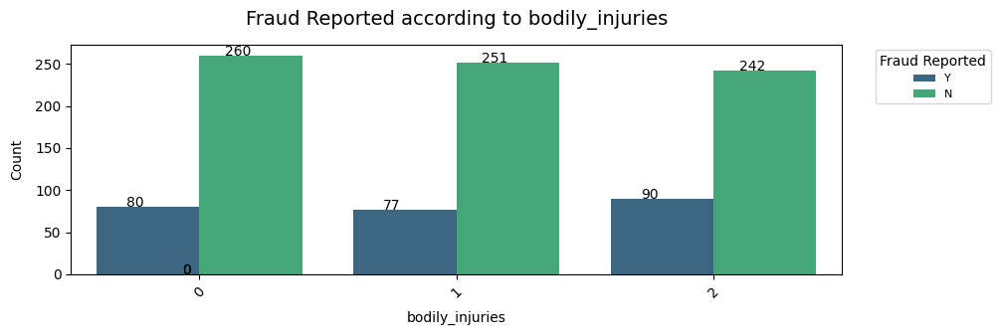

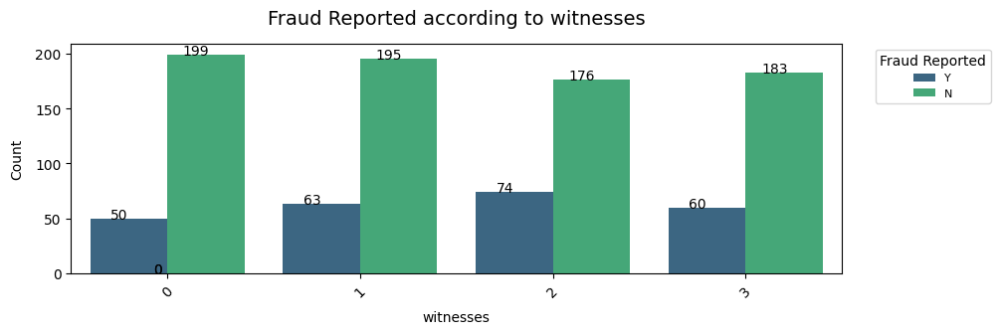

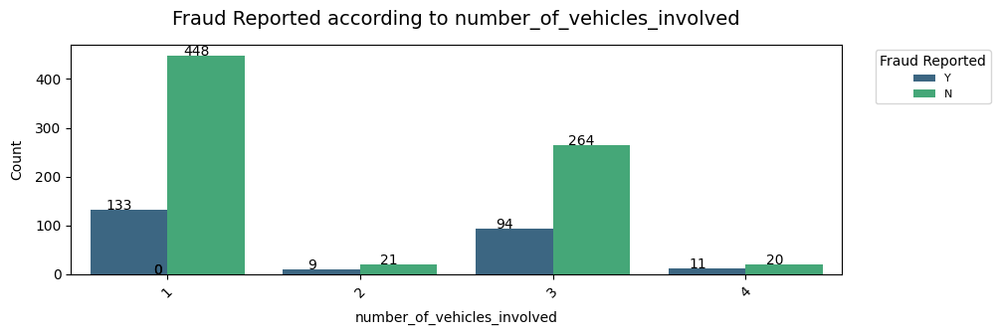

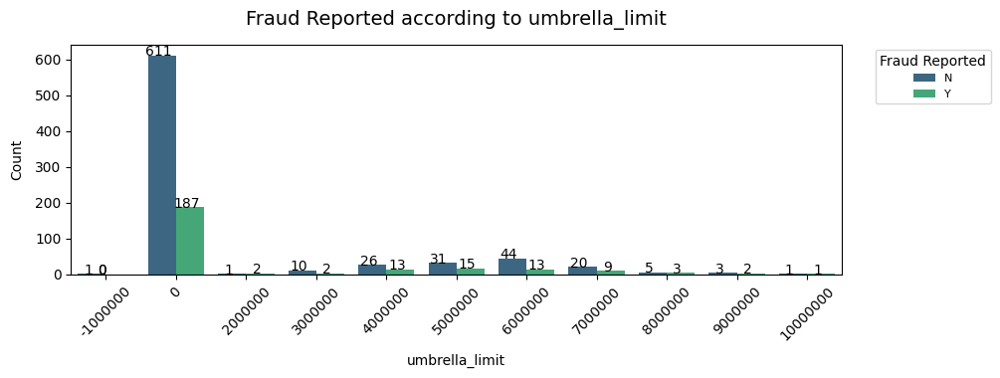

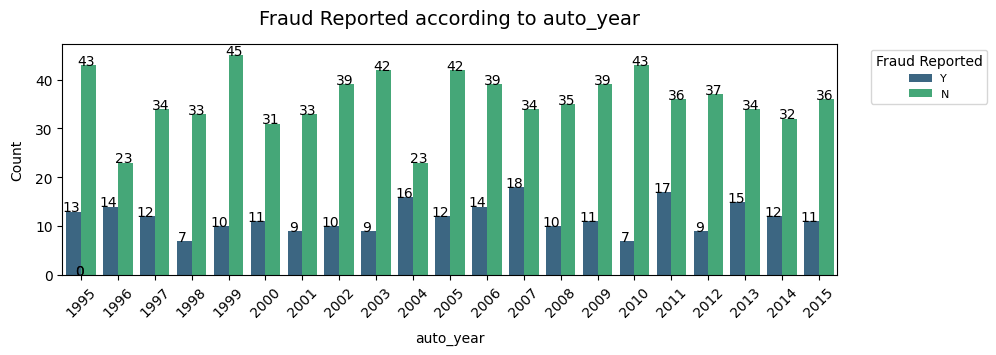

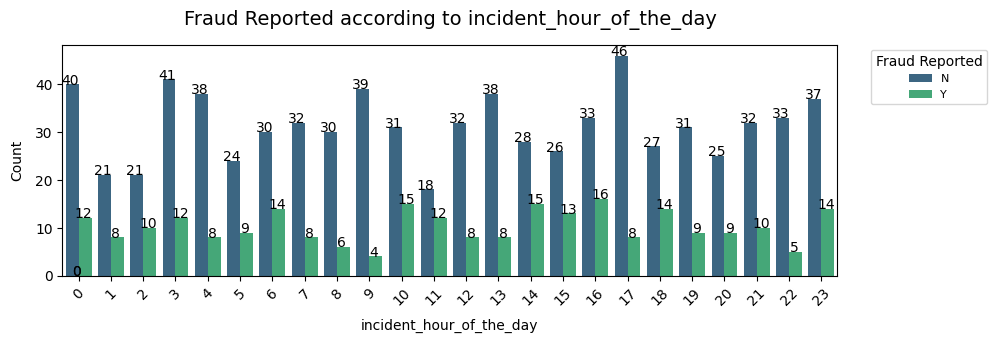

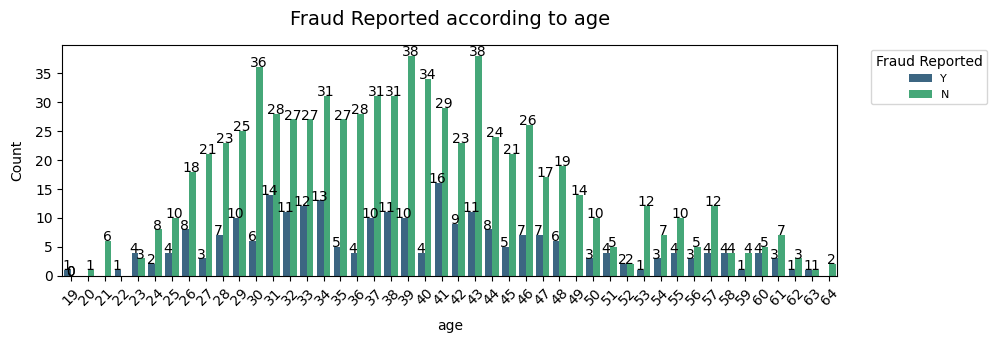

In [35]:
for i in num_cat_col:
    plt.figure(figsize=(10, 3))
    
    ax = sns.countplot(hue='fraud_reported', x=i, data=df, palette='viridis')
    
    plt.xlabel(i, size=10, labelpad=8)
    plt.ylabel('Count', size=10, labelpad=8)
    plt.xticks(rotation=45)
    plt.legend(prop={'size':8}, loc='upper right', bbox_to_anchor=(1.20, 1)).set_title("Fraud Reported")
    plt.title(f"Fraud Reported according to {i}", size=14, y=1.05)
    
    # Show counts on bars
    for p in ax.patches:
        count = int(p.get_height())
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(count, (x, y), size=10, ha='center')

### Preprocesing incident_date column

In [36]:
df['year'] = df['incident_date'].dt.year
df['month'] = df['incident_date'].dt.month
df['day'] = df['incident_date'].dt.day

In [37]:
# Group by incident_severity, year, month, and fraud_reported, and calculate the mean for each numeric column.
incident_severity_by_month_year = df.groupby(['incident_severity','year', 'month','fraud_reported'], as_index=False).mean()
incident_severity_by_month_year.drop(['auto_year','day'], axis=1, inplace=True)
incident_severity_by_month_year['incident_date'] = pd.to_datetime(incident_severity_by_month_year[['year', 'month']].assign(day=1))
incident_severity_by_month_year

,incident_severity,year,month,fraud_reported,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,incident_date
0,Major Damage,2015,1,N,207.025641,40.025641,1076.923077,1200.168718,3.589744e+05,21271.794872,-22320.512821,12.384615,2.102564,0.820513,1.282051,64118.717949,9954.358974,9321.025641,44843.333333,2015-01-01
1,Major Damage,2015,1,Y,194.590909,38.333333,1143.939394,1320.356667,1.030303e+06,22869.696970,-22740.909091,11.803030,1.969697,0.984848,1.530303,65131.666667,8545.151515,10081.515152,46505.000000,2015-01-01
2,Major Damage,2015,2,N,212.463415,40.073171,1109.756098,1242.820244,7.073171e+05,22112.195122,-20156.097561,12.975610,2.170732,0.878049,1.780488,62713.902439,8973.170732,8232.926829,45507.804878,2015-02-01
3,Major Damage,2015,2,Y,207.452381,38.500000,1178.571429,1205.100000,1.523810e+06,20347.619048,-30150.000000,12.928571,1.976190,1.095238,1.714286,63707.380952,8820.000000,8725.000000,46162.380952,2015-02-01
4,Major Damage,2015,3,N,216.333333,36.666667,1333.333333,1268.163333,1.666667e+06,21900.000000,0.000000,7.666667,2.333333,1.333333,2.666667,60193.333333,8760.000000,7940.000000,43493.333333,2015-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,Trivial Damage,2015,6,N,285.000000,47.000000,1000.000000,1216.680000,0.000000e+00,55100.000000,0.000000,8.000000,1.000000,1.000000,1.000000,2700.000000,300.000000,300.000000,2100.000000,2015-06-01
73,Trivial Damage,2015,9,N,292.000000,45.000000,1000.000000,1358.910000,0.000000e+00,0.000000,0.000000,4.000000,1.000000,0.000000,2.000000,7370.000000,670.000000,1340.000000,5360.000000,2015-09-01
74,Trivial Damage,2015,10,N,104.750000,31.250000,875.000000,1250.112500,0.000000e+00,13050.000000,-20225.000000,8.750000,1.000000,1.250000,1.750000,5477.500000,947.500000,670.000000,3860.000000,2015-10-01
75,Trivial Damage,2015,11,N,112.000000,32.000000,1000.000000,1238.920000,0.000000e+00,57800.000000,-53700.000000,4.000000,1.000000,0.000000,2.000000,5060.000000,460.000000,920.000000,3680.000000,2015-11-01


### droppping incident_date column

In [38]:
print(f"The column year has only {df.year.unique()} as unique value.")

The column year has only [2015] as unique value.


Therefore we can drop it

In [39]:
# Drop the Date column
df.drop(['incident_date','year','policy_bind_date'], axis=1, inplace=True)

In [40]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'month', 'day'],
      dtype='object')

In [41]:
df.shape

(1000, 36)

## Multivariate Analysis

### Pairplot

In [42]:
df.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'month', 'day'],
      dtype='object')

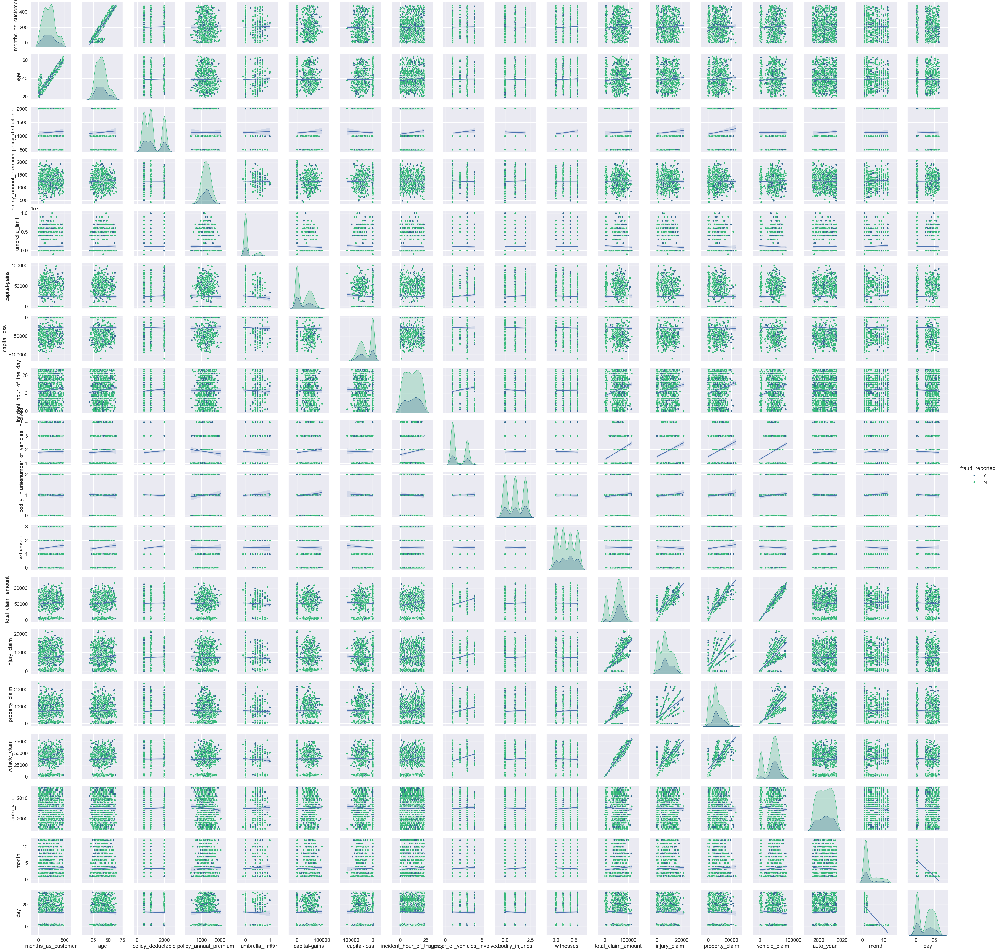

In [43]:
sns.set(font_scale=1.5)  
grid = sns.pairplot((df), hue='fraud_reported', palette = "viridis")

# Add a regression line for non-diagonal plots
for ax in grid.axes.flat[1:-1]: # first and last axes are not considered
    if ax.get_xlabel() != ax.get_ylabel():
        sns.regplot(data=df, x=ax.get_xlabel(), y=ax.get_ylabel(), scatter=False, ax=ax, color='b')

plt.show()

Theres a positive corelation between age and months as customer

vehicle_claim, property claim, injury claim and total claim amount

#### Encoding fraud_reported (Y:1, N:0)

In [44]:
df['fraud_reported'] = df['fraud_reported'].map({'Y': 1, 'N': 0})
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,71610,6510,13020,52080,Saab,92x,2004,1,1,25
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,5070,780,780,3510,Mercedes,E400,2007,1,1,21
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,34650,7700,3850,23100,Dodge,RAM,2007,0,2,22
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,63400,6340,6340,50720,Chevrolet,Tahoe,2014,1,10,1
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,6500,1300,650,4550,Accura,RSX,2009,0,2,17


### Correlation check

In [45]:
# Calculate the correlation between features
cor = df.corr()
cor

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported,month,day
months_as_customer,1.000000,0.922098,0.026807,0.005018,0.015498,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,0.020544,0.024659,-0.011092
age,0.922098,1.000000,0.029188,0.014404,0.018126,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,0.012143,0.023404,-0.006131
policy_deductable,0.026807,0.029188,1.000000,-0.003245,0.010870,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,0.014817,-0.006418,-0.018160
policy_annual_premium,0.005018,0.014404,-0.003245,1.000000,-0.006247,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,-0.014480,0.021559,0.014835
umbrella_limit,0.015498,0.018126,0.010870,-0.006247,1.000000,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893,0.058622,0.042409,-0.021716
capital-gains,0.006399,-0.007075,0.035212,-0.013738,-0.047268,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,-0.019173,0.029409,0.015418
capital-loss,0.020209,0.007368,-0.023544,0.023547,-0.024056,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,-0.014863,0.023216,-0.015035
incident_hour_of_the_day,0.070639,0.087161,0.060935,-0.001578,-0.023257,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,0.004316,0.044827,-0.027965
number_of_vehicles_involved,0.014736,0.022102,0.051214,-0.045991,-0.021270,0.061643,-0.014895,0.120794,1.000000,0.014030,-0.014669,0.274278,0.224650,0.219084,0.269393,0.034554,0.051839,0.032544,-0.018672
bodily_injuries,-0.010162,-0.015679,-0.022765,0.026780,0.022743,0.055829,-0.024418,-0.034563,0.014030,1.000000,-0.005606,0.047093,0.047319,0.039749,0.043449,-0.020527,0.033877,0.047035,-0.032062


In [46]:
# Listing the correlation coeficients with the target variable 
corr_df = cor.unstack().sort_values(ascending=False).reset_index()
corr_df.columns = ['Feature A', 'Feature B', 'Corr coef']
corr_df[(corr_df['Feature A'] == 'fraud_reported') ]

,Feature A,Feature B,Corr coef
14,fraud_reported,fraud_reported,1.000000
48,fraud_reported,vehicle_claim,0.170049
52,fraud_reported,total_claim_amount,0.163651
54,fraud_reported,property_claim,0.137835
58,fraud_reported,injury_claim,0.090975
90,fraud_reported,umbrella_limit,0.058622
100,fraud_reported,number_of_vehicles_involved,0.051839
103,fraud_reported,witnesses,0.049497
132,fraud_reported,bodily_injuries,0.033877
170,fraud_reported,months_as_customer,0.020544


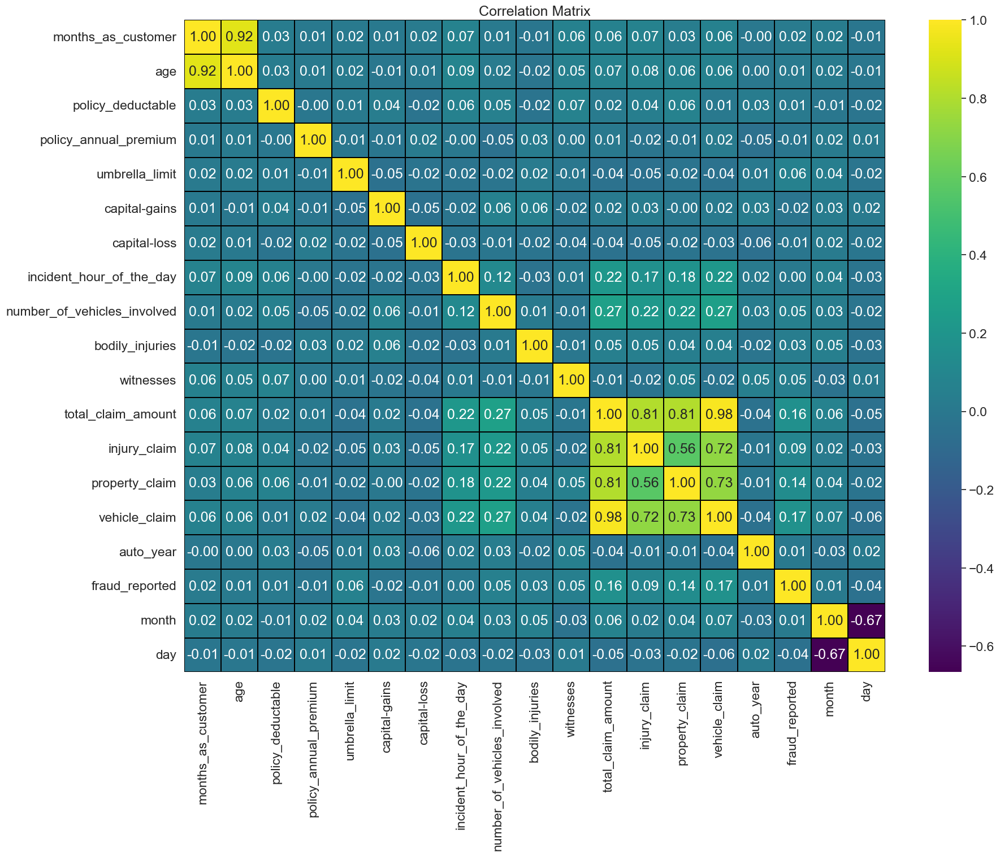

In [47]:
# Visualizing the correlation matrix by plotting heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(cor, linewidths = 0.1, fmt = ".2f", linecolor = 'black', cmap='viridis', annot=True)
plt.yticks(rotation = 0)
plt.title('Correlation Matrix')
plt.show()

#### Observation:

The target variable shows low correlation with total_claim_amount (+0.16), vehicle_claim (+0.17), and property_claim (+0.14).

Age exhibits a high correlation with months_as_customer (+0.92).

Total_claim_amount is strongly correlated with injury_claim(+0.81), property_claim(+0.81), and vehicle_claim(+0.98).

Month demonstrates a high negative correlation with day (-0.67).

The number_of_vehicles_involved moderately correlates with total_claim_amount (+0.27).

# Preprocessing Data

### Missing Values

Dataset has no missing values. but it has '?' which we will replace with nan

In [48]:
# Replacing all occurrences of '?' with np.NaN 
df = df.replace('?', np.NaN)

In [49]:
# checking the null values
miss_val = df.isnull().sum().to_frame("Null values")

# Calculate the % of the null values
miss_val["% of missing"] = round(miss_val['Null values'] / len(df) * 100,2)
miss_val = miss_val.sort_values(by='% of missing', ascending=False)

# List only columns with missing values
miss_val[miss_val['% of missing']>0]

,Null values,% of missing
property_damage,360,36.0
police_report_available,343,34.3
collision_type,178,17.8


We will impute the null values 

### Imputing missing values

In [50]:
imputing_col = miss_val[miss_val['% of missing'] > 0].index.to_list()
imputing_col

['property_damage', 'police_report_available', 'collision_type']

For 'property_damage', 'police_report_available', and 'collision_type' columns we will use the mode to impute the missing values since they are categorical variables.

In [51]:
# listing the possible imputation values 
for col in imputing_col:
    print(f"Column = {col} Mode = {df[col].mode()[0]}")

Column = property_damage Mode = NO
Column = police_report_available Mode = NO
Column = collision_type Mode = Rear Collision


In [52]:
from scipy.stats import mode

def calculate_mode(x, col):
    ''' calculate the mode for <x>. If there is no value return the mode for the column <col>'''
    mode_result = pd.Series.mode(x)
    return mode_result.iloc[0] if not mode_result.empty else df[col].mode()[0]

impu_val = {}

# Define Columns to group the data
group_col = ['incident_type','fraud_reported']

# Impute missing values of categorical columns with the mode according to 'fraud_reported' and 'incident_type'.
for col in imputing_col:
    impu_val[col] = {name: calculate_mode(group[col],col) for name, group in df.groupby(group_col)}
    print(f"Impute the missing values in {col} with the mode:")
    display(impu_val[col])

    # Fill missing values with the mode 
    print(f"Missing values in {col} to impute: {df[col].isnull().sum()}")    
    df[col] = df[col].fillna(df.apply(lambda row: impu_val[col].get((row['incident_type'], row['fraud_reported']), row[col]), axis=1))
    print(f"Missing values remaining in {col}: {df[col].isnull().sum()}\n")

Impute the missing values in property_damage with the mode:


{('Multi-vehicle Collision', 0): 'NO',
 ('Multi-vehicle Collision', 1): 'NO',
 ('Parked Car', 0): 'NO',
 ('Parked Car', 1): 'YES',
 ('Single Vehicle Collision', 0): 'NO',
 ('Single Vehicle Collision', 1): 'YES',
 ('Vehicle Theft', 0): 'NO',
 ('Vehicle Theft', 1): 'NO'}

Missing values in property_damage to impute: 360
Missing values remaining in property_damage: 0

Impute the missing values in police_report_available with the mode:


{('Multi-vehicle Collision', 0): 'NO',
 ('Multi-vehicle Collision', 1): 'NO',
 ('Parked Car', 0): 'NO',
 ('Parked Car', 1): 'NO',
 ('Single Vehicle Collision', 0): 'YES',
 ('Single Vehicle Collision', 1): 'NO',
 ('Vehicle Theft', 0): 'NO',
 ('Vehicle Theft', 1): 'NO'}

Missing values in police_report_available to impute: 343
Missing values remaining in police_report_available: 0

Impute the missing values in collision_type with the mode:


{('Multi-vehicle Collision', 0): 'Side Collision',
 ('Multi-vehicle Collision', 1): 'Rear Collision',
 ('Parked Car', 0): 'Rear Collision',
 ('Parked Car', 1): 'Rear Collision',
 ('Single Vehicle Collision', 0): 'Rear Collision',
 ('Single Vehicle Collision', 1): 'Front Collision',
 ('Vehicle Theft', 0): 'Rear Collision',
 ('Vehicle Theft', 1): 'Rear Collision'}

Missing values in collision_type to impute: 178
Missing values remaining in collision_type: 0



In [53]:
df.isnull().sum().sum()

0

### Encoding Categorical features

In [54]:
 # Checking the unique values of the categorical independent variables
encoding_col = cat_col[:-1]
    
for i, col in enumerate(encoding_col):
    print(f"{i+1}.{col}:\n  {df[col].unique()}\n")

1.policy_state:
  ['OH' 'IN' 'IL']

2.policy_csl:
  ['250/500' '100/300' '500/1000']

3.insured_sex:
  ['MALE' 'FEMALE']

4.insured_education_level:
  ['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']

5.insured_occupation:
  ['craft-repair' 'machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'handlers-cleaners' 'adm-clerical'
 'farming-fishing']

6.insured_hobbies:
  ['sleeping' 'reading' 'board-games' 'bungie-jumping' 'base-jumping' 'golf'
 'camping' 'dancing' 'skydiving' 'movies' 'hiking' 'yachting' 'paintball'
 'chess' 'kayaking' 'polo' 'basketball' 'video-games' 'cross-fit'
 'exercise']

7.insured_relationship:
  ['husband' 'other-relative' 'own-child' 'unmarried' 'wife' 'not-in-family']

8.incident_type:
  ['Single Vehicle Collision' 'Vehicle Theft' 'Multi-vehicle Collision'
 'Parked Car']

9.collision_type:
  ['Side Collision' 'Rear Collision' 'Front Co

In [55]:
from sklearn.preprocessing import LabelEncoder

category_mappings = {}

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
for col in encoding_col:
    df[col] = label_encoder.fit_transform(df[col])
    
    # Store the mapping in a dictionary
    category_mappings[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    print(col,'\n', category_mappings[col],'\n')
    
display(df.head())
display(df.tail())

policy_state 
 {'IL': 0, 'IN': 1, 'OH': 2} 

policy_csl 
 {'100/300': 0, '250/500': 1, '500/1000': 2} 

insured_sex 
 {'FEMALE': 0, 'MALE': 1} 

insured_education_level 
 {'Associate': 0, 'College': 1, 'High School': 2, 'JD': 3, 'MD': 4, 'Masters': 5, 'PhD': 6} 

insured_occupation 
 {'adm-clerical': 0, 'armed-forces': 1, 'craft-repair': 2, 'exec-managerial': 3, 'farming-fishing': 4, 'handlers-cleaners': 5, 'machine-op-inspct': 6, 'other-service': 7, 'priv-house-serv': 8, 'prof-specialty': 9, 'protective-serv': 10, 'sales': 11, 'tech-support': 12, 'transport-moving': 13} 

insured_hobbies 
 {'base-jumping': 0, 'basketball': 1, 'board-games': 2, 'bungie-jumping': 3, 'camping': 4, 'chess': 5, 'cross-fit': 6, 'dancing': 7, 'exercise': 8, 'golf': 9, 'hiking': 10, 'kayaking': 11, 'movies': 12, 'paintball': 13, 'polo': 14, 'reading': 15, 'skydiving': 16, 'sleeping': 17, 'video-games': 18, 'yachting': 19} 

insured_relationship 
 {'husband': 0, 'not-in-family': 1, 'other-relative': 2, 'own-ch

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,2,1,1000,1406.91,0,1,4,2,...,71610,6510,13020,52080,10,1,2004,1,1,25
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,10,1
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
995,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
996,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
997,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
998,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26
999,456,60,2,1,1000,766.19,0,0,0,11,...,5060,460,920,3680,8,12,2007,0,2,26


## Removing outliers

In [56]:
# Detect outliers with zscore method
from scipy.stats import zscore

z = np.abs(zscore(df))
z

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,1.078140,0.990836,1.187173,0.060937,0.222383,0.616705,0.479476,1.076953,0.530931,1.158316,...,0.714257,0.189283,1.165505,0.749653,0.856466,1.645743,0.183440,1.746019,0.735040,1.141603
1,0.208995,0.334073,0.016856,0.060937,1.412784,0.242521,1.697980,1.076953,0.530931,0.162558,...,1.807312,1.363822,1.372696,1.823346,0.360539,0.657470,0.315491,1.746019,0.735040,0.758386
2,0.608002,1.088913,1.187173,1.182668,1.412784,0.642233,1.697980,0.928546,1.557877,1.082141,...,0.686362,0.054644,0.736072,0.785565,0.631315,0.959702,0.315491,0.572731,0.429664,0.854190
3,0.452355,0.224613,1.220886,0.060937,1.412784,0.652886,2.133471,0.928546,1.557877,1.407256,...,0.403135,0.224130,0.219722,0.677607,0.879279,1.319074,1.479664,1.746019,2.013343,1.157698
4,0.208995,0.552994,1.220886,1.304542,0.222383,1.341980,2.133471,1.076953,1.522961,1.082141,...,1.753121,1.257232,1.399654,1.768252,1.623169,1.049545,0.648112,0.572731,0.429664,0.375169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.746582,0.103769,1.187173,1.304542,0.222383,0.222884,0.479476,0.928546,1.044404,1.158316,...,1.305049,2.051155,0.273817,1.224309,0.135388,1.196528,0.149180,0.572731,0.429664,0.854190
996,0.704407,0.224613,1.220886,1.182668,0.222383,0.739141,0.479476,0.928546,1.557877,0.584261,...,2.111466,2.182342,2.214794,1.821868,1.600357,0.780016,1.645974,0.572731,0.735040,1.045799
997,0.642767,0.541611,1.187173,0.060937,1.039966,0.520739,0.826998,0.928546,1.044404,1.407256,...,0.558507,0.013648,0.020826,0.771902,1.104430,0.028570,1.513924,0.572731,0.735040,0.949994
998,2.208028,2.523284,1.220886,1.304542,1.412784,0.411866,1.697980,1.076953,1.522961,0.411497,...,0.219110,0.453708,0.451976,0.073580,1.375206,1.286371,1.181303,0.572731,0.429664,1.237407


In [57]:
# threshold = 3
df_new = df[(z<3).all(axis=1)]

print(f"{df.shape[0] - df_new.shape[0]} rows with outliers were deleted.")
print(f"This represent {round((df.shape[0] - df_new.shape[0]) / df.shape[0] *100, 2)}% of the data.")
print(f"In the new dataset there are {df_new.shape[0]} rows and {df.shape[1]} columns.")
df_process = df_new.copy()
df_process

20 rows with outliers were deleted.
This represent 2.0% of the data.
In the new dataset there are 980 rows and 36 columns.


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,2,1,1000,1406.91,0,1,4,2,...,71610,6510,13020,52080,10,1,2004,1,1,25
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,10,1
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
996,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
997,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
998,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26


## Skewness

In [58]:
# Checking the skewness in the data
df_skew = df_process.skew().sort_values(ascending=False).to_frame("Skew")
df_skew

,Skew
umbrella_limit,1.801424
month,1.388336
fraud_reported,1.188267
property_damage,0.592559
number_of_vehicles_involved,0.509725
policy_deductable,0.476090
age,0.475385
capital-gains,0.466619
months_as_customer,0.362608
property_claim,0.361356


The features which has values greater than 0.5 has to undergo transformatin methods. Lets see which fits the best

In [59]:
# Subsetting the features with a skew > 0.5
skew_columns = df_skew[abs(df_skew['Skew']) > 0.5].index.to_list()
skew_columns = sorted(skew_columns)
skew_columns


['fraud_reported',
 'month',
 'number_of_vehicles_involved',
 'property_damage',
 'total_claim_amount',
 'umbrella_limit',
 'vehicle_claim']

In [60]:
# Checking skewness using cuberoot method and log method
skew_columns = ['fraud_reported',
 'month',
 'number_of_vehicles_involved',
 'property_damage',
 'total_claim_amount',
 'umbrella_limit',
 'vehicle_claim']
df_transformed = pd.DataFrame()

for col in skew_columns:
    df_transformed[f"{col}_cbrt"] = np.cbrt(df_process[col])
    df_transformed[f"{col}_log"] = np.log(df_process[col])
    df_transformed[f"{col}_sqrt"] = np.sqrt(df_process[col])
        
# Adding the other columns
df_transformed = pd.concat([df_transformed, df_process[skew_columns]], axis=1)

In [61]:
# Comparing which transform method give better results
df_comp = df_transformed.skew().sort_index(ascending=False).to_frame("Skewness")

# Reset the index and identify the feature
df_comp.reset_index(inplace=True)
df_comp['feature'] = df_comp['index'].str.extract(r'^(.*)_.*')
df_comp['Skewness_abs'] = abs(df_comp['Skewness'])

# Drop the records with no valid skewness
df_comp = df_comp[~df_comp.Skewness.isnull()]

# Find the indexes of the rows with the minimum 'Skewness_abs' values
min_indices = df_comp.groupby('feature')['Skewness_abs'].idxmin()

# Select the rows corresponding to the minimum values in Skewness_abs,
low_skewness = df_comp.loc[min_indices]
low_skewness

,index,Skewness,feature,Skewness_abs
27,fraud_reported,1.188267,fraud,1.188267
24,fraud_reported_sqrt,1.188267,fraud_reported,1.188267
21,month_log,0.647115,month,0.647115
19,number_of_vehicles_involved,0.509725,number_of_vehicles,0.509725
17,number_of_vehicles_involved_log,0.406658,number_of_vehicles_involved,0.406658
15,property_damage,0.592559,property,0.592559
12,property_damage_sqrt,0.592559,property_damage,0.592559
11,total_claim_amount,-0.593593,total_claim,0.593593
8,total_claim_amount_sqrt,-1.132140,total_claim_amount,1.132140
7,umbrella_limit,1.801424,umbrella,1.801424


#### Lets apply log transform to month column only as all other columns had no much change for the skewness transformation

In [62]:
df_process['month'] = np.log(df_process['month'])  

In [63]:
# Checking the skewness in the data
df_skew = df_process.skew().sort_values(ascending=False).to_frame("Skew")
df_skew

,Skew
umbrella_limit,1.801424
fraud_reported,1.188267
month,0.647115
property_damage,0.592559
number_of_vehicles_involved,0.509725
policy_deductable,0.476090
age,0.475385
capital-gains,0.466619
months_as_customer,0.362608
property_claim,0.361356


## Feature Scaling using Standard Scalarization

### Separating features and label

In [64]:
# Separating the independent and target variables into x and y 
x = df_process.drop('fraud_reported', axis=1)
y = df_process['fraud_reported']

print(f"Feature Dimension = {x.shape}")
print(f"Label Dimension = {y.shape}")

Feature Dimension = (980, 35)
Label Dimension = (980,)


### Scaling

In [65]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Scaling the data 
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

display(x.head())

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,month,day
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.467878,1.071971,0.532901,-1.156087,...,1.191534,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594,-0.998010,1.142661
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,1.890767,1.071971,0.532901,-0.160292,...,-0.839254,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476,-0.998010,0.758573
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,1.890767,-0.932861,1.556905,1.084451,...,-0.839254,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476,-0.171526,0.854595
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.362496,-0.932861,1.556905,-1.405036,...,-0.839254,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975,1.747511,-1.161866
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.362496,1.071971,-1.515109,1.084451,...,-0.839254,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190,-0.171526,0.374486


## Muticollinearity Analysis and Feature Selection

### Checking VIF

In [66]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = vif.sort_values(by='VIF values', ascending=False)

# listing the variables with VIF > 10
vif[vif['VIF values'] > 10]

,Features,VIF values
29,vehicle_claim,inf
28,property_claim,inf
27,injury_claim,inf
26,total_claim_amount,inf


After evaluating the VIF, we obtained infinite values (inf) for the following variables, indicating perfect or nearly perfect multicollinearity:

 vehicle_claim
 
 property_claim
 
 injury_claim
 
 total_claim_amount

No other variables had VIF values greater than 10, indicating they don't have high correlation with each other. Our plan is to start by dropping one of these columns. If multicollinearity issues persist, we'll then consider removing the column with the highest VIF. We will also analyze how these variables correlate with the target variable in the context of our project.

In [67]:
# Reviewing the correlation between label and the features with multicollinearity
corr_df[(corr_df['Feature A'] == 'fraud_reported') & (corr_df['Feature B'].isin(['vehicle_claim', 'property_claim', 'injury_claim', 'total_claim_amount'])) ]

,Feature A,Feature B,Corr coef
48,fraud_reported,vehicle_claim,0.170049
52,fraud_reported,total_claim_amount,0.163651
54,fraud_reported,property_claim,0.137835
58,fraud_reported,injury_claim,0.090975


First we will go ahead and drop the injury_claim and then check the collinearity 

In [68]:
x = x.drop(['injury_claim'] , axis=1) 

In [69]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = vif.sort_values(by='VIF values', ascending=False)

# listing the variables with VIF > 10
vif[vif['VIF values'] > 10]

,Features,VIF values
26,total_claim_amount,63.693219
28,vehicle_claim,46.879585


Next we will drop the total_claim_amount column and check for the collinearity

In [70]:
x = x.drop(['total_claim_amount'] , axis=1) 

In [71]:
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = vif.sort_values(by='VIF values', ascending=False)

# listing the variables with VIF > 10
vif[vif['VIF values'] > 10]

,Features,VIF values


Now we are assured that there are no Multicolloinearity causing columns and proceed ahead

## Final check

In [72]:
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

vif.sort_values(by='VIF values', ascending=False)

,Features,VIF values
1,age,6.901580
0,months_as_customer,6.890072
21,number_of_vehicles_involved,5.182608
14,incident_type,5.169505
27,vehicle_claim,2.509161
26,property_claim,2.243082
31,month,2.014489
32,day,2.011704
16,incident_severity,1.207382
25,police_report_available,1.116806


## Balancing the dataset

In [73]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1, y1 = SM.fit_resample(x, y)

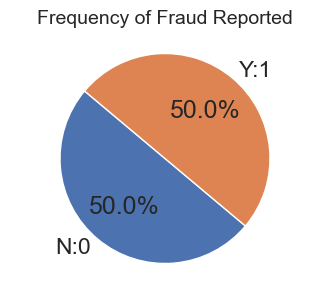

In [74]:
# target count
target_counts = y1.value_counts()

# Create a pie plot
plt.figure(figsize=(4, 3))
plt.pie(target_counts, labels=['N:0','Y:1'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Fraud Reported", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [75]:
X = x1
Y = y1

# Modelling

### Finding the best random state

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def find_best_random_state(model, x, y):
    best_acc = 0
    best_random_state = 0

    for i in range(1,200):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_acc:
            best_acc = acc
            best_random_state = i
            
    return [best_random_state, best_acc]

In [77]:

%%time
# Build the model
model = RandomForestClassifier()
random_state, acc = find_best_random_state(model, X, Y) 
print(f"Best accuracy is {round(acc,4)} at random_state {random_state}")
print(f"Best random_state {random_state}")

Best accuracy is 0.9302 at random_state 187
Best random_state 187
CPU times: total: 44 s
Wall time: 1min 6s


## Creating train test split

In [78]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
print("x_train shape: ", x_train.shape)
print("x_test shape:  ", x_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape:  ", y_test.shape)

x_train shape:  (1036, 33)
x_test shape:   (444, 33)
y_train shape:  (1036,)
y_test shape:   (444,)


## Classification Algorithms

In [79]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [80]:
# Functions 
def calc_accuracy(model, id_model):
    ''' Calculate the accuracy of the model. Return the accuracy, training accuracy, and the predicted values.'''
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    acc = accuracy_score(y_test, y_pred)
    acc_train = model.score(x_train, y_train)
    
    print(f"\nModel: {id_model}")
    print(f"Confusion matrix: \n {confusion_matrix(y_test, y_pred)}")
    print(f"Classification report: \n {classification_report(y_test, y_pred)}" )
    print(f"Training Accuracy using {id_model} is {acc_train*100.0:.2f}%")
    print(f"The accuracy score using {id_model} is {round(acc*100.0, 2)}%")
    
    return [acc, acc_train, y_pred]

In [82]:
models = {'RandomForestClassifier' : RandomForestClassifier(), 
          'ExtraTreesClassifier': ExtraTreesClassifier(),
          'LogisticRegression': LogisticRegression(),
          'SVC': SVC(),
          'GradientBoostingClassifier': GradientBoostingClassifier(), 
          'AdaBoostClassifier': AdaBoostClassifier(), 
          'BaggingClassifier': BaggingClassifier()}

# Setting up for saving the results of each model
df_model_accuracy = pd.DataFrame(columns=['id','Model','Training Accuracy','Model Accuracy Score'])
y_pred = {}

### RandomForestClassifier

In [83]:
%%time
id_model = 'RandomForestClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = pd.concat([df_model_accuracy, model_metrics_df], ignore_index=True)
y_pred[id_model] = pred


Model: RandomForestClassifier
Confusion matrix: 
 [[202   6]
 [ 24 212]]
Classification report: 
               precision    recall  f1-score   support

           0       0.89      0.97      0.93       208
           1       0.97      0.90      0.93       236

    accuracy                           0.93       444
   macro avg       0.93      0.93      0.93       444
weighted avg       0.94      0.93      0.93       444

Training Accuracy using RandomForestClassifier is 100.00%
The accuracy score using RandomForestClassifier is 93.24%
CPU times: total: 266 ms
Wall time: 363 ms


### Extra Trees Classifier

In [84]:
%%time
id_model = 'ExtraTreesClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: ExtraTreesClassifier
Confusion matrix: 
 [[199   9]
 [ 21 215]]
Classification report: 
               precision    recall  f1-score   support

           0       0.90      0.96      0.93       208
           1       0.96      0.91      0.93       236

    accuracy                           0.93       444
   macro avg       0.93      0.93      0.93       444
weighted avg       0.93      0.93      0.93       444

Training Accuracy using ExtraTreesClassifier is 100.00%
The accuracy score using ExtraTreesClassifier is 93.24%
CPU times: total: 62.5 ms
Wall time: 228 ms


### Logistic Regression

In [85]:
%%time

id_model = 'LogisticRegression'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: LogisticRegression
Confusion matrix: 
 [[174  34]
 [ 53 183]]
Classification report: 
               precision    recall  f1-score   support

           0       0.77      0.84      0.80       208
           1       0.84      0.78      0.81       236

    accuracy                           0.80       444
   macro avg       0.80      0.81      0.80       444
weighted avg       0.81      0.80      0.80       444

Training Accuracy using LogisticRegression is 76.74%
The accuracy score using LogisticRegression is 80.41%
CPU times: total: 0 ns
Wall time: 31 ms


### Support Vector Machine Classifier

In [86]:
%%time

id_model = 'SVC'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: SVC
Confusion matrix: 
 [[190  18]
 [ 25 211]]
Classification report: 
               precision    recall  f1-score   support

           0       0.88      0.91      0.90       208
           1       0.92      0.89      0.91       236

    accuracy                           0.90       444
   macro avg       0.90      0.90      0.90       444
weighted avg       0.90      0.90      0.90       444

Training Accuracy using SVC is 96.43%
The accuracy score using SVC is 90.32%
CPU times: total: 15.6 ms
Wall time: 101 ms


### Gradient Boosting Classifier

In [87]:
%%time

id_model = 'GradientBoostingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: GradientBoostingClassifier
Confusion matrix: 
 [[198  10]
 [ 20 216]]
Classification report: 
               precision    recall  f1-score   support

           0       0.91      0.95      0.93       208
           1       0.96      0.92      0.94       236

    accuracy                           0.93       444
   macro avg       0.93      0.93      0.93       444
weighted avg       0.93      0.93      0.93       444

Training Accuracy using GradientBoostingClassifier is 97.30%
The accuracy score using GradientBoostingClassifier is 93.24%
CPU times: total: 656 ms
Wall time: 715 ms


### AdaBoost Classifier

In [89]:
%%time

id_model = 'AdaBoostClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: AdaBoostClassifier
Confusion matrix: 
 [[192  16]
 [ 25 211]]
Classification report: 
               precision    recall  f1-score   support

           0       0.88      0.92      0.90       208
           1       0.93      0.89      0.91       236

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444

Training Accuracy using AdaBoostClassifier is 89.38%
The accuracy score using AdaBoostClassifier is 90.77%
CPU times: total: 156 ms
Wall time: 217 ms


### Bagging Classifier

In [90]:
%%time

id_model = 'BaggingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
model_metrics_df = pd.DataFrame([model_metrics])

df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: BaggingClassifier
Confusion matrix: 
 [[200   8]
 [ 29 207]]
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.96      0.92       208
           1       0.96      0.88      0.92       236

    accuracy                           0.92       444
   macro avg       0.92      0.92      0.92       444
weighted avg       0.92      0.92      0.92       444

Training Accuracy using BaggingClassifier is 99.03%
The accuracy score using BaggingClassifier is 91.67%
CPU times: total: 78.1 ms
Wall time: 158 ms


# Comparing each model

In [91]:
df_model_accuracy = df_model_accuracy.sort_values(by='Model Accuracy Score', ascending=False)
display(df_model_accuracy)

,id,Model,Training Accuracy,Model Accuracy Score
0,RandomForestClassifier,"(DecisionTreeClassifier(max_features='sqrt', r...",1.000000,0.932432
1,ExtraTreesClassifier,"(ExtraTreeClassifier(random_state=1068466179),...",1.000000,0.932432
4,GradientBoostingClassifier,([DecisionTreeRegressor(criterion='friedman_ms...,0.972973,0.932432
7,BaggingClassifier,(DecisionTreeClassifier(random_state=443787862...,0.990347,0.916667
5,AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.893822,0.907658
6,AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.893822,0.907658
3,SVC,SVC(),0.964286,0.903153
2,LogisticRegression,LogisticRegression(),0.767375,0.804054


# Cross validation score

In [92]:
def checking_cvscore(id_model, model, y_pred):
    score = cross_val_score(model, X, Y, cv=5, scoring='accuracy')
    
    score_mean = score.mean()
    diff = accuracy_score(y_test, y_pred) - score_mean
    
    print(f"\n::: Model: {id_model}::: \nscore:{score}")
    print(f"Score mean: {score_mean:.4f}")
    print(f"Difference between Accuracy score and cross validation score is {diff:.4f}")
    return [score_mean, diff]

In [93]:
# Define the new columns for CV metrics
df_model_accuracy['CV score mean'] = np.NaN
df_model_accuracy['Diff Acc and cv score'] = np.NaN
# Setting the id model as index
df_model_accuracy.set_index("id", inplace=True)

In [94]:
%%time
# Evaluate cross-validation for each model and save the scores.
for id_model, model in models.items():
    score_mean, diff = checking_cvscore(id_model, model, y_pred[id_model])
    
    df_model_accuracy.loc[id_model, 'CV score mean'] = score_mean
    df_model_accuracy.loc[id_model, 'Diff Acc and cv score'] = diff


::: Model: RandomForestClassifier::: 
score:[0.76013514 0.84121622 0.93581081 0.95608108 0.94256757]
Score mean: 0.8872
Difference between Accuracy score and cross validation score is 0.0453

::: Model: ExtraTreesClassifier::: 
score:[0.86486486 0.89189189 0.95608108 0.97972973 0.96621622]
Score mean: 0.9318
Difference between Accuracy score and cross validation score is 0.0007

::: Model: LogisticRegression::: 
score:[0.76013514 0.75337838 0.77027027 0.81081081 0.78040541]
Score mean: 0.7750
Difference between Accuracy score and cross validation score is 0.0291

::: Model: SVC::: 
score:[0.81081081 0.82432432 0.88851351 0.93243243 0.92567568]
Score mean: 0.8764
Difference between Accuracy score and cross validation score is 0.0268

::: Model: GradientBoostingClassifier::: 
score:[0.79054054 0.87162162 0.93243243 0.94256757 0.91891892]
Score mean: 0.8912
Difference between Accuracy score and cross validation score is 0.0412

::: Model: AdaBoostClassifier::: 
score:[0.71621622 0.820945

In [95]:
df_model_accuracy.sort_values(by=['Model Accuracy Score', 'CV score mean','Diff Acc and cv score'], ascending=[False, False, True])

,Model,Training Accuracy,Model Accuracy Score,CV score mean,Diff Acc and cv score
id,,,,,
ExtraTreesClassifier,"(ExtraTreeClassifier(random_state=1068466179),...",1.000000,0.932432,0.931757,0.000676
GradientBoostingClassifier,([DecisionTreeRegressor(criterion='friedman_ms...,0.972973,0.932432,0.891216,0.041216
RandomForestClassifier,"(DecisionTreeClassifier(max_features='sqrt', r...",1.000000,0.932432,0.887162,0.045270
BaggingClassifier,(DecisionTreeClassifier(random_state=443787862...,0.990347,0.916667,0.870270,0.046396
AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.893822,0.907658,0.868919,0.038739
AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.893822,0.907658,0.868919,0.038739
SVC,SVC(),0.964286,0.903153,0.876351,0.026802
LogisticRegression,LogisticRegression(),0.767375,0.804054,0.775000,0.029054


After applying cross validation, the difference between model accuracy and the cv mean is 0.000676 which is the leasat one.

Therefore ExtrraTreeClassifier is our best model

## Hyper Parameter Tuning

In [97]:
model = ExtraTreesClassifier()
model.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [108]:
from sklearn.ensemble import ExtraTreesClassifier

param_grid = {
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy'],
    'min_samples_split': np.arange(1, 5),  
    'min_samples_leaf': np.arange(1, 5),  
    'n_estimators': np.arange(100, 350, 10), 
    'max_depth': [None] + list(np.arange(80, 150, 10)), 
    'max_features': ['auto', 'sqrt', 'log2'],
    'random_state': [random_state, 50, 500, 1000],
    'n_jobs': [-1, 0, 1]
}

moedl=ExtraTreesClassifier()

In [109]:
%%time 

# Perform search with cross validation
# Create RandomizedSearchCV
random_search = RandomizedSearchCV(model, param_distributions=param_grid, 
                                   n_iter=10, scoring='accuracy', cv=5, 
                                   random_state=random_state, n_jobs=-1)
# Fit the model 
random_search.fit(x_train, y_train)

CPU times: total: 188 ms
Wall time: 2 s


RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 80, 90, 100, 110,
                                                      120, 130, 140],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': array([1, 2, 3, 4]),
                                        'min_samples_split': array([1, 2, 3, 4]),
                                        'n_estimators': array([100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220,
       230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340]),
                                        'n_jobs': [-1, 0, 1],
                                        'random_state': [187, 50, 500, 1000]},
                   random_state=187, scoring='accuracy')

In [110]:
# Get the best hyperparameters and the best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters for ExtraTreesClassifier model:")
display(best_params)

Best Parameters for ExtraTreesClassifier model:


{'random_state': 500,
 'n_jobs': -1,
 'n_estimators': 120,
 'min_samples_split': 3,
 'min_samples_leaf': 3,
 'max_features': 'sqrt',
 'max_depth': 120,
 'criterion': 'entropy',
 'bootstrap': False}

In [111]:
best_model

ExtraTreesClassifier(criterion='entropy', max_depth=120, min_samples_leaf=3,
                     min_samples_split=3, n_estimators=120, n_jobs=-1,
                     random_state=500)

## Final Model

In [115]:
# Create the model with the best parameters
best_model = ExtraTreesClassifier (criterion = 'gini',
                                   bootstrap = False,
                                   max_depth = 90,
                                   max_features = 'sqrt',
                                   min_samples_split = 2,
                                   min_samples_leaf = 1,
                                   n_estimators = 270,
                                   n_jobs = -1, 
                                   random_state = 500)

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)

# Check the accuracy
acc = accuracy_score(y_test, y_pred)
print(f"accuracy_score: {round(acc*100,2)}%")

accuracy_score: 94.37%


### Plotting ROC and compare AUC for all the models used

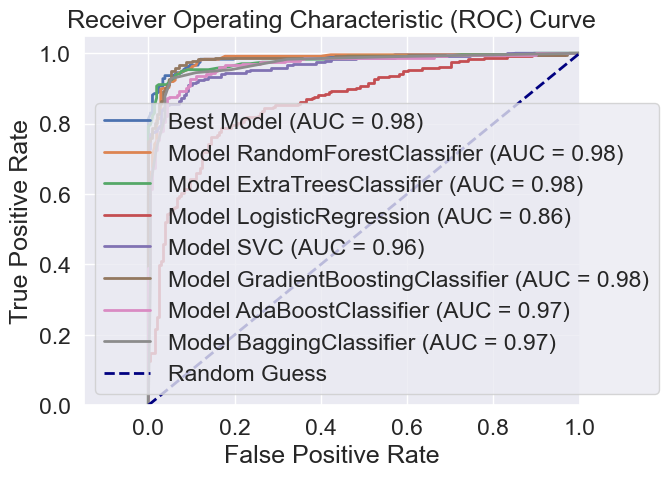

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Initialize the plot
fig, ax = plt.subplots()

# Define a function to plot ROC curves
def plot_roc(model, X_test, y_test, ax, label):
    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X_test)[:, 1] 
    else:
        y_score = model.decision_function(X_test)   
        
    fpr, tpr, _ = roc_curve(y_test, y_score)     
    roc_auc = auc(fpr, tpr)                      
    ax.plot(fpr, tpr, lw=2, label=f'{label} (AUC = {roc_auc:.2f})') 

# Plot ROC Curve for the Best Model
plot_roc(best_model, x_test, y_test, ax, label='Best Model')

# Plot ROC Curves for each Model in the dictionary
for id_model, model in models.items():
    plot_roc(model, x_test, y_test, ax, label=f'Model {id_model}')

# Plot the random guess line
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')

# Customize the plot
ax.set_xlim([-0.15, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Receiver Operating Characteristic (ROC) Curve')
ax.legend(loc='lower left')

# Show the plot
plt.show()


The best model is Extratreesclassifier marked in blue color

## Plotting ROC and compare AUC for the best model

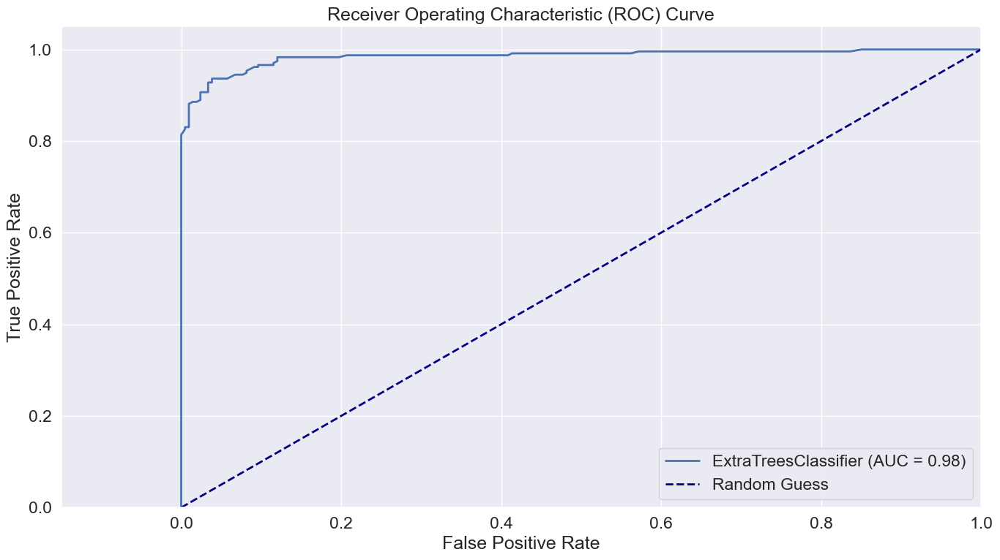

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Function to plot the ROC curve
def plot_roc(model, X_test, y_test, ax, label):
    # Check if model has predict_proba
    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(X_test)[:, 1] 
    else:
        y_score = model.decision_function(X_test)   
        
    fpr, tpr, _ = roc_curve(y_test, y_score)    
    roc_auc = auc(fpr, tpr)                      #
    ax.plot(fpr, tpr, lw=2, label=f'{label} (AUC = {roc_auc:.2f})')  

# Initialize the plot
fig, ax = plt.subplots(figsize=(14, 8))  # Adjust the figure size as needed

# Plot ROC Curve for the Best Model
plot_roc(best_model, x_test, y_test, ax, label='ExtraTreesClassifier')

# Plot ROC Curves for each Model in the dictionary (if you have more models to plot)
# for id_model, model in models.items():
#     plot_roc(model, x_test, y_test, ax, label=f'Model {id_model}')

# Plot the random guess line
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')

# Customize the plot
ax.set_xlim([-0.15, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Receiver Operating Characteristic (ROC) Curve')
ax.legend(loc='lower right')

# Adjust layout to ensure everything fits well
plt.tight_layout()

# Show the plot
plt.show()


# Saving the model

In [139]:
import joblib
joblib.dump(best_model, "fraud_detection_model.pkl")

['fraud_detection_model.pkl']

# Conclusion:

- Dataset dimension: 1000 rows and 40 columns

- Columns left after analysis:36

- Target variablle is fraud_reported which is categorical variable(y/n)

- To mitigate multicollinearity issues, two columns, 'injury_claim' and 'total_claim_amount,' were dropped.

- The best performing model was ExtraTreesClassifier which gave the accuracy of 94.37% after hyperparameter tuning